In [1]:
import scanpy as sc
import anndata as ann
import numpy as np 
import seaborn as sb
import pandas as pd
import pickle
from sklearn import preprocessing as pp
import diffxpy.api as de
import time
from scipy import sparse

import sys  
sys.path.insert(0, '/lustre/groups/ml01/code/karin.hrovatin/mm_pancreas_atlas_rep/code/')
from importlib import reload  
import helper
reload(helper)
import helper as h
from constants import SAVE
import expected_multiplet_rate as emr
reload(emr)
import expected_multiplet_rate as emr
#sc.settings.verbosity = 3

from matplotlib import rcParams
import matplotlib.pyplot as plt

#R interface
import rpy2.rinterface_lib.callbacks
import logging
from rpy2.robjects import pandas2ri
import anndata2ri

rpy2.rinterface_lib.callbacks.logger.setLevel(logging.ERROR)
pandas2ri.activate()
anndata2ri.activate()
%load_ext rpy2.ipython

In [3]:
%%R
library(scran)
library(biomaRt)
library(BiocParallel)
#library(Seurat)


Error in library(scran) : there is no package called ‘scran’


In [4]:
# Path for saving results - last shared folder by all datasets
shared_folder='/lustre/groups/ml01/workspace/karin.hrovatin/data/pancreas/scRNA/islet_fltp_headtail/rev4/'
UID2='Fltp_2y_annotation'

Load data:

In [5]:
#Load data
#adata=pickle.load(  open( shared_folder+"data_normalised.pkl", "rb" ) )
adata=h.open_h5ad(shared_folder+"data_normalised.h5ad",unique_id2=UID2)

## Add previously generated annotation

This annotation was not published - done for another lab-internal project by another scientist. It was used only for internal validation and no analyses in this project depend on it.

In [19]:
# Add previously generated annotation (Maren Buttner)
adata_preannotated=h.open_h5ad("/lustre/groups/ml01/workspace/karin.hrovatin/data/pancreas/scRNA/islet_fltp_headtail/rev4/maren/data/adult_data_annotated.h5ad",unique_id2=UID2)

/home/icb/karin.hrovatin/miniconda3/envs/rpy2_3/lib/python3.8/site-packages/anndata/compat/__init__.py:158: FutureWarning: Moving element from .uns['neighbors']['distances'] to .obsp['distances'].

This is where adjacency matrices should go now.
  warn(
/home/icb/karin.hrovatin/miniconda3/envs/rpy2_3/lib/python3.8/site-packages/anndata/compat/__init__.py:158: FutureWarning: Moving element from .uns['neighbors']['connectivities'] to .obsp['connectivities'].

This is where adjacency matrices should go now.
  warn(


In [8]:
adata_preannotated

AnnData object with n_obs × n_vars = 17584 × 17591
    obs: 'batch', 'sample_id', 'sample_name', 'FVR_sort', 'venus_construct_plus', 'venus_construct_minus', 'n_counts', 'log_counts', 'n_genes', 'mt_fraction', 'louvain', 'S_score', 'G2M_score', 'phase', 'cell_type', 'louvain_R', 'cell_type_refined'
    var: 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'FVR_sort_colors', 'cell_type_colors', 'cell_type_refined_colors', 'louvain', 'louvain_R_colors', 'louvain_colors', 'neighbors', 'pca', 'phase_colors', 'sample_id_colors', 'sample_name_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [29]:
# Match the cell names between preanotated and current dataset
adata_preannotated.obs.index=['-'.join(idx.split('-')[:-1]+[file]) for idx,file in zip(adata_preannotated.obs.index,adata_preannotated.obs.sample_id)]

In [30]:
# Add pre-prepared cell type annotation to currently used dataset
for annotation in ['cell_type','cell_type_refined']:
    adata.obs['pre_'+annotation]=adata_preannotated.obs.reindex(adata.obs.index)[annotation]
    adata.obs['pre_'+annotation] = adata.obs['pre_'+annotation].cat.add_categories('NA')
    adata.obs['pre_'+annotation].fillna('NA', inplace =True) 

Pre-annotated cell counts

In [34]:
# Count of cells per annotation
for annotation in ['cell_type','cell_type_refined']:
    print('pre_'+annotation)
    print(adata.obs['pre_'+annotation].value_counts())

pre_cell_type
beta           13730
alpha           1945
delta            669
poly             406
gamma            345
endothelial      144
immune           114
NA                 0
Name: pre_cell_type, dtype: int64
pre_cell_type_refined
beta                   13730
alpha                   2000
delta                    669
gamma                    364
endothelial              144
beta-delta               130
alpha-delta              130
immune                   114
beta, proliferating       28
alpha-beta                26
beta-gamma                18
NA                         0
Name: pre_cell_type_refined, dtype: int64


In [36]:
# Rename annotation columns so that the desired annotation gets the name 'pre_cell_type'
adata.obs.rename(columns={'pre_cell_type':'pre_cell_type_coarse','pre_cell_type_refined':'pre_cell_type'},inplace=True)

## Visualisation

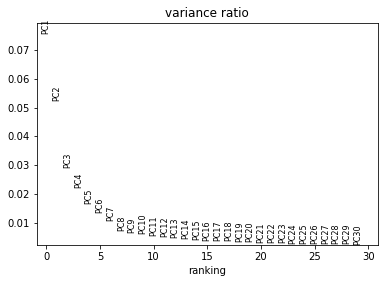

In [37]:
sc.pp.pca(adata, n_comps=30, use_highly_variable=True, svd_solver='arpack')
sc.pl.pca_variance_ratio(adata)

In [38]:
# Select number of PCs to use
N_PCS=15

Compare different embeddings based on previously defined annotation. 

In [13]:
#sc.pp.neighbors(adata,n_pcs = N_PCS,metric='correlation') 
#sc.tl.umap(adata)

In [14]:
#rcParams['figure.figsize']=(7,7)
#sc.pl.umap(adata,size=10,color=['pre_cell_type'])
#sc.pl.umap(adata,size=10,color=['file'])

In [39]:
sc.pp.neighbors(adata,n_pcs = N_PCS) 
sc.tl.umap(adata)

In [84]:
# With default colours the beta and beta,proliferating  could not be separated well - change the color for beta,proliferating
pos=len(adata.uns['pre_cell_type_colors'])-1
color='#000000'
if color not in adata.uns['pre_cell_type_colors']:
    adata.uns['pre_cell_type_colors'][pos]=color
else:
    print('Colour is already present:',adata.uns['pre_cell_type_colors'])

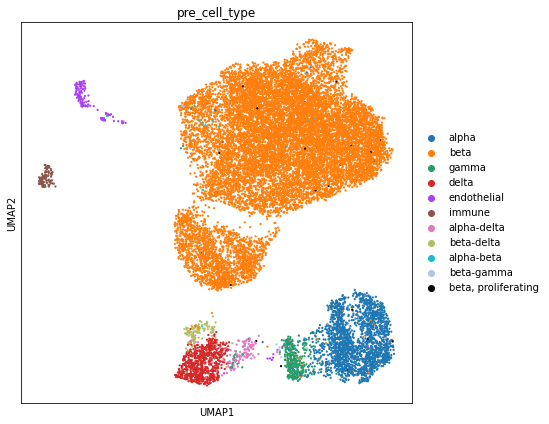

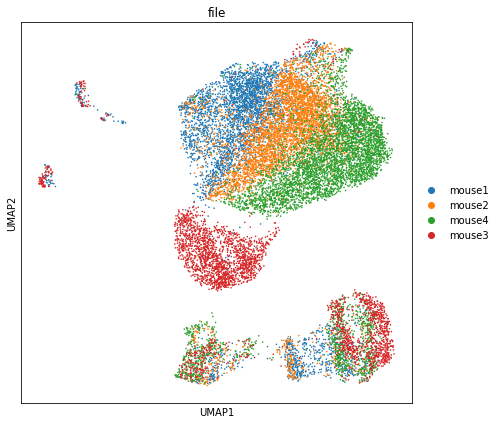

In [85]:
rcParams['figure.figsize']=(7,7)
sc.pl.umap(adata,size=20,color=['pre_cell_type'])
sc.pl.umap(adata,size=10,color=['file'])

## Cell cycle
Performed separately for individual batches.

### Seurat/Scanpy - score by G2M and S

In [41]:
# Load mouse cell cycle genes
cell_cycle_mm=pd.read_table('/lustre/groups/ml01/workspace/karin.hrovatin/data/pancreas/gene_lists/cell_cycle_mm_Macosko2015.tsv',sep='\t')

Use cell cycle genes that overlap HVGs (from different batches). Display these genes on HVG plots (with non-phase genes being marked as .NA).

Use G2/M and M gene sets for G2/M annotation and S gene set for S annotation.

G1/S N genes: 92 overlap var: 90 overlap hvg (all): 4
S N genes: 96 overlap var: 92 overlap hvg (all): 7
G2/M N genes: 127 overlap var: 122 overlap hvg (all): 20
M N genes: 143 overlap var: 138 overlap hvg (all): 20
M/G1 N genes: 108 overlap var: 106 overlap hvg (all): 6
N genes for scoring S: 7 and G2/M: 40


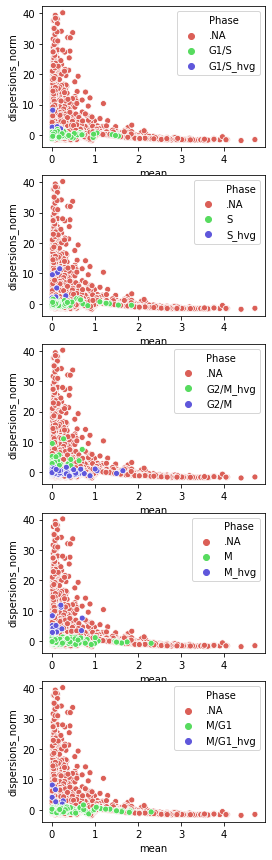

In [42]:
# How many of the cell cycle phase genes are present in HVG and in var and how variable they are
hvg=set(adata.var_names[adata.var.highly_variable])
i=0
rcParams['figure.figsize']=(4,15)
fig,axs=plt.subplots(5)
s_hvg=[]
g2m_hvg=[]
for phase in cell_cycle_mm.Phase.unique():
    genes_phase = set(cell_cycle_mm.query('Phase =="'+phase+'"').Gene)
    overlap_var = set(adata.var_names) & genes_phase
    overlap_hvg = hvg & genes_phase
    print(phase,'N genes:',len(genes_phase),'overlap var:',len(overlap_var),'overlap hvg (all):',len(overlap_hvg))
    phase_df=pd.DataFrame([phase]*len(overlap_var),index=overlap_var,columns=['Phase']).reindex(adata.var_names).fillna('.NA').sort_values('Phase')
    phase_df.loc[overlap_hvg,'Phase']=phase+'_hvg'
    phase_df['mean']=adata.var.means
    phase_df['dispersions_norm']=adata.var.dispersions_norm
    sb.scatterplot(x="mean", y="dispersions_norm", hue="Phase",data=phase_df,ax=axs[i],palette='hls')
    i+=1
    if phase == 'S':
        s_hvg.extend(overlap_hvg)
    if phase in ['G2/M','M']:
        g2m_hvg.extend(overlap_hvg)
        
print('N genes for scoring S:',len(s_hvg),'and G2/M:',len(g2m_hvg))

#C: N of genes for S scoring is very small.

Cell cycle annotation

In [43]:
# Annotated cell cycle per batch
adata.obs['S_score']= np.zeros(adata.shape[0])
adata.obs['G2M_score'] = np.zeros(adata.shape[0])
adata.obs['phase'] = np.zeros(adata.shape[0])

for batch in enumerate(adata.obs['file'].cat.categories):
    batch=batch[1]
    idx = adata.obs.query('file=="'+batch+'"').index
    adata_tmp = adata[idx,:].copy()
    sc.tl.score_genes_cell_cycle(adata_tmp, s_genes=s_hvg, g2m_genes=g2m_hvg,use_raw=False)
    adata.obs.loc[idx,'S_score'] = adata_tmp.obs['S_score']
    adata.obs.loc[idx,'G2M_score'] = adata_tmp.obs['G2M_score']
    adata.obs.loc[idx,'phase'] = adata_tmp.obs['phase']
    
del adata_tmp

In [44]:
# Count of cells annotated to each phase
adata.obs['phase'].value_counts()

G1     7882
S      6877
G2M    2594
Name: phase, dtype: int64

Display cell cycle score distributions and annotation.

... storing 'phase' as categorical


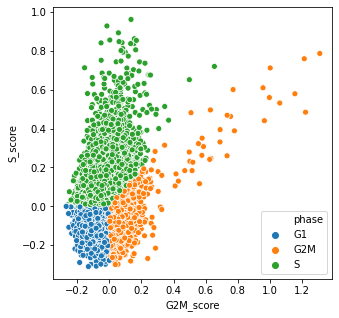

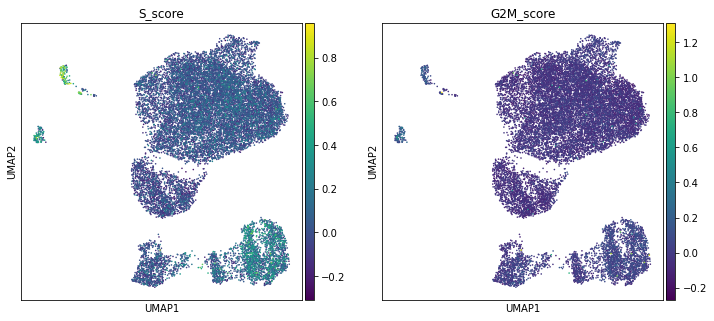

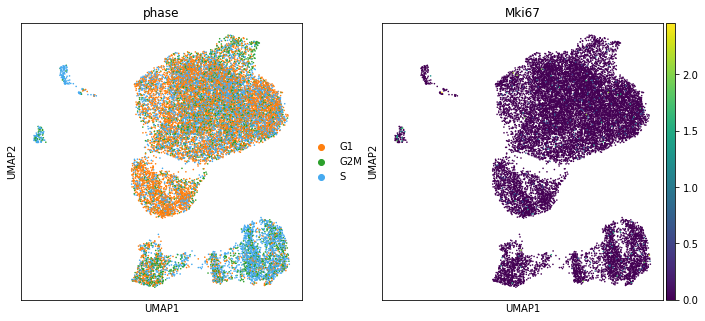

In [45]:
adata.uns['phase_colors']=['#ff7f0e', '#2ca02c','#46aaf0']

rcParams['figure.figsize']=(5,5)
sb.scatterplot(x='G2M_score',y='S_score',hue='phase',data=adata.obs)
sc.pl.umap(adata, color=['S_score', 'G2M_score'], size=10, use_raw=False)
sc.pl.umap(adata, color=['phase','Mki67'], size=10, use_raw=False)

 ### Cyclone - based on G1, S, and G2/M scores

Add gene Entrez IDs to adata in order to map genes to cell cycle database.

In [251]:
# Adata genes for R
genes=adata.var_names

In [252]:
%%R -i genes -o gene_ids
# Extract Ensembl gene IDs
mouse = useMart("ensembl", dataset = "mmusculus_gene_ensembl")
gene_ids = getBM(attributes = c("mgi_symbol",'ensembl_gene_id'), filters = "mgi_symbol", values = genes , mart = mouse, uniqueRows=FALSE)

In [48]:
# Add gene ids to adata, use only genes with unique mapped ensembl ids
gene_ids.drop_duplicates(subset='mgi_symbol', keep=False, inplace=True)
gene_ids.index=gene_ids.mgi_symbol
gene_ids=gene_ids.reindex(list(adata.var_names))
adata.var['EID']=gene_ids.ensembl_gene_id

In [49]:
# Prepare R data for cyclonee
x_mat=adata.X.T
gene_ids=adata.var.EID
batches=adata.obs.file
cells=adata.obs.index

In [50]:
%%R -i x_mat -i gene_ids -i batches -i cells -o cyclone_anno
# Cyclone cell scores, calculated separately for each batch
mm.pairs <- readRDS(system.file("exdata", "mouse_cycle_markers.rds", package="scran"))
phases<-c()
s<-c()
g2m<-c()
g1<-c()
cells_order<-c()
for(batch in unique(batches)){
    # Select batch data
    x_mat_batch=x_mat[,batches==batch]
    print(batch,dim(x_mat_batch[1]))
    # Scores
    assignments <- cyclone(x_mat_batch, mm.pairs, gene.names=gene_ids,BPPARAM=MulticoreParam(workers = 16))
    phases<-c(phases,assignments$phases)
    s<-c(s,assignments$score$S)
    g2m<-c(g2m,assignments$score$G2M)
    g1<-c(g1,assignments$score$G1)
    # Save cell order
    cells_order<-c(cells_order,cells[batches==batch])
}
cyclone_anno<-data.frame(phase_cyclone=phases,s_cyclone=s,g2m_cyclone=g2m,g1_cyclone=g1)
rownames(cyclone_anno)<-cells_order

[1] "mouse1"
[1] "mouse2"
[1] "mouse4"
[1] "mouse3"


In [51]:
# Count of cells annotated to each phase
cyclone_anno.phase_cyclone.value_counts()

G1     17342
G2M        9
S          2
Name: phase_cyclone, dtype: int64

In [52]:
# Add cyclone annotation to adata
cyclone_anno=cyclone_anno.reindex(adata.obs.index)
adata.obs=pd.concat([adata.obs,cyclone_anno],axis=1)

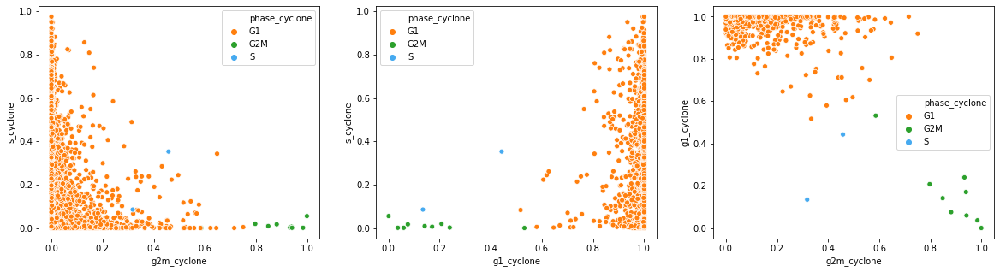

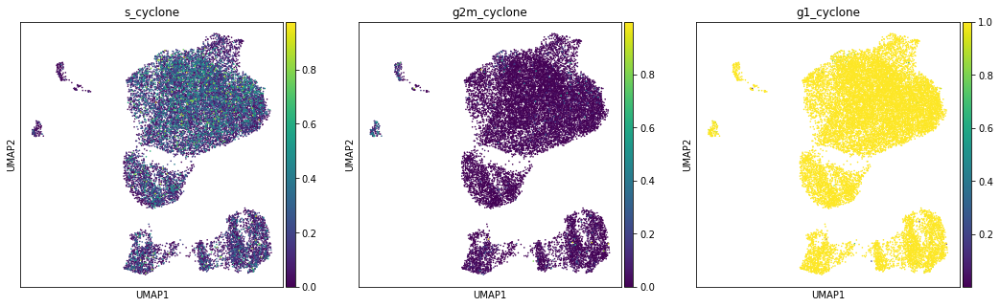

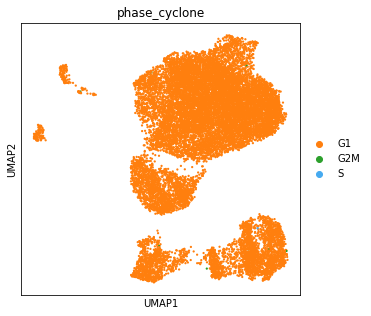

In [135]:
# Plot score distributions and cell assignment on UMAP
rcParams['figure.figsize']=(20,5)
fig,axs=plt.subplots(1,3)
palette=sb.color_palette(['#ff7f0e', '#2ca02c','#46aaf0'])
sb.scatterplot(x='g2m_cyclone',y='s_cyclone',hue='phase_cyclone',data=cyclone_anno,ax=axs[0],palette=palette)
sb.scatterplot(x='g1_cyclone',y='s_cyclone',hue='phase_cyclone',data=cyclone_anno,ax=axs[1],palette=palette)
sb.scatterplot(x='g2m_cyclone',y='g1_cyclone',hue='phase_cyclone',data=cyclone_anno,ax=axs[2],palette=palette)
rcParams['figure.figsize']=(5,5)
sc.pl.umap(adata, color=['s_cyclone', 'g2m_cyclone','g1_cyclone'], size=10, use_raw=False)
adata.uns['phase_cyclone_colors']=['#ff7f0e', '#2ca02c','#46aaf0']
sc.pl.umap(adata, color=['phase_cyclone'], size=20, use_raw=False)

#C: The cyclone results seem more reliable as different cell cycle stages are not mixed up and as expected most cells are not dividing (consistent with Mki67 expression). However, based on z-scaled data (below) there might be a proliferatin subpopulation.

## Save intermediate results before cell type annotation

In [64]:
if SAVE:
    h.save_h5ad(adata, shared_folder+"data_annotated.h5ad",unique_id2=UID2)

# Cell type annotation

In [5]:
adata=h.open_h5ad(shared_folder+"data_annotated.h5ad",unique_id2=UID2)

## Endo high annotation

In [6]:
# Normalise raw data for cell type scoring
adata_rawnorm=adata.raw.to_adata().copy()
adata_rawnorm.X /= adata.obs['size_factors'].values[:,None] # This reshapes the size-factors array
sc.pp.log1p(adata_rawnorm)
adata_rawnorm.X = np.asarray(adata_rawnorm.X)
adata_rawnorm.obs=adata.obs.copy()

#### Ins

In [8]:
# Compute Ins score
sc.tl.score_genes(adata_rawnorm, gene_list=['Ins1','Ins2'], score_name='ins_score',  use_raw=False)

<ipython-input-13-1b559b26e534>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ins_scores['ins_score_norm']=pp.minmax_scale(ins_scores.ins_score)


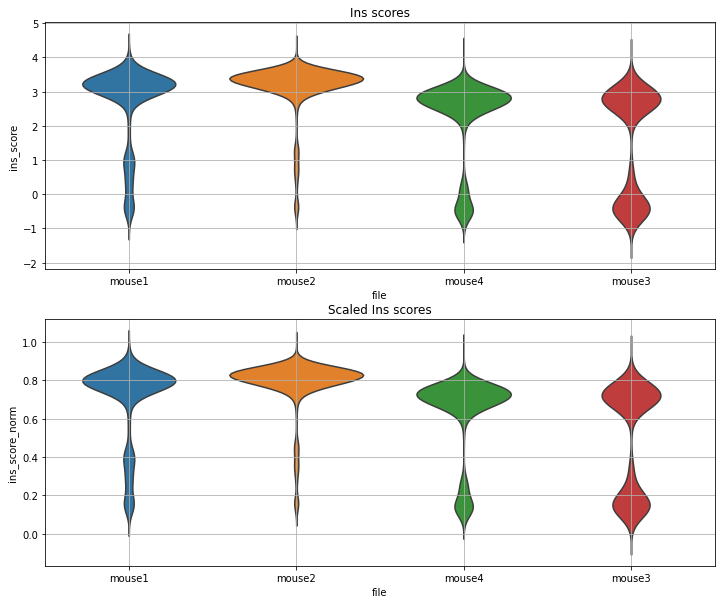

In [13]:
#sc.pl.violin(adata_rawnorm, keys=['ins_score'], groupby='file', stripplot=False, jitter=True)
ins_scores=adata_rawnorm.obs[['ins_score','file']]
ins_scores['ins_score_norm']=pp.minmax_scale(ins_scores.ins_score)
rcParams['figure.figsize']=(12,10)
fig,axs=plt.subplots(2,1)
sb.violinplot(x='file',y='ins_score',data=ins_scores,inner=None,ax=axs[0])
axs[0].title.set_text('Ins scores')
axs[0].grid()
sb.violinplot(x='file',y='ins_score_norm',data=ins_scores,inner=None,ax=axs[1])
axs[1].title.set_text('Scaled Ins scores')
axs[1].grid()
#sb.violinplot(x='file',y='ins_score_norm',data=ins_scores[ins_scores.ins_score_norm>0.15],inner=None,ax=axs[2])
#axs[2].title.set_text('Scaled Ins scores without very low Ins cells')
#axs[2].grid()

In [28]:
# Find ins high cells
# Use different thresholds across files as there might be different ambient counts (or other effects), 
# thus shifting distributions up a bit
file_thresholds={'mouse1':0.6,'mouse2':0.6,'mouse4':0.5,'mouse3':0.5}
adata_rawnorm.obs['ins_high']=ins_scores.apply(lambda x: x.ins_score_norm > file_thresholds[x.file], axis=1)
print('Proportion of ins high across samples:')
adata_rawnorm.obs[['file','ins_high']].groupby('file').ins_high.value_counts(normalize=True,sort=False)

Proportion of ins high across samples:


file    ins_high
mouse1  False       0.207621
        True        0.792379
mouse2  False       0.078259
        True        0.921741
mouse4  False       0.179138
        True        0.820862
mouse3  False       0.404512
        True        0.595488
Name: ins_high, dtype: float64

In [26]:
# Add info about ins high to main adata and save it
adata.obs['ins_score']=adata_rawnorm.obs['ins_score']
adata.obs['ins_high']=adata_rawnorm.obs['ins_high']

#### Gcg

In [7]:
genes=['Gcg']
score_name='gcg'

In [8]:
# Compute score
sc.tl.score_genes(adata_rawnorm, gene_list=genes, score_name=score_name+'_score',  use_raw=False)

<ipython-input-11-279bbddaaf9d>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  scores[score_name+'_score_norm']=pp.minmax_scale(scores[score_name+'_score'])


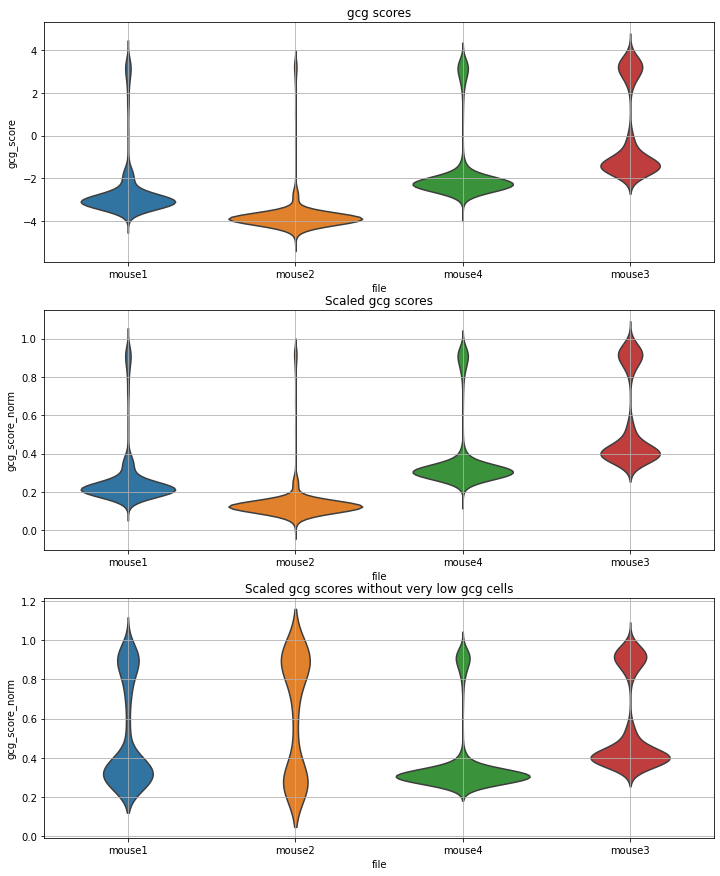

In [11]:
scores=adata_rawnorm.obs[[score_name+'_score','file']]
scores[score_name+'_score_norm']=pp.minmax_scale(scores[score_name+'_score'])
rcParams['figure.figsize']=(12,15)
fig,axs=plt.subplots(3,1)
sb.violinplot(x='file',y=score_name+'_score',data=scores,inner=None,ax=axs[0])
axs[0].title.set_text(score_name+' scores')
axs[0].grid()
sb.violinplot(x='file',y=score_name+'_score_norm',data=scores,inner=None,ax=axs[1])
axs[1].title.set_text('Scaled '+score_name+' scores')
axs[1].grid()
sb.violinplot(x='file',y=score_name+'_score_norm',data=scores[scores[score_name+'_score_norm']>0.25],
             inner=None,ax=axs[2])
axs[2].title.set_text('Scaled '+score_name+' scores without very low '+score_name+' cells')
axs[2].grid()

In [12]:
# Find score high cells
# Use different thresholds across files as there might be different ambient counts (or other effects), 
# thus shifting distributions up a bit
file_thresholds={'mouse1':0.6,'mouse2':0.6,'mouse4':0.65,'mouse3':0.7}
adata_rawnorm.obs[score_name+'_high']=scores.apply(lambda x: x[score_name+'_score_norm'] > file_thresholds[x.file], 
                                                   axis=1)
print('Proportion of '+score_name+' high across samples:')
adata_rawnorm.obs[['file',score_name+'_high']].groupby('file')[score_name+'_high'].value_counts(
    normalize=True,sort=False)

Proportion of gcg high across samples:


file    gcg_high
mouse1  False       0.919394
        True        0.080606
mouse2  False       0.974914
        True        0.025086
mouse4  False       0.874044
        True        0.125956
mouse3  False       0.698702
        True        0.301298
Name: gcg_high, dtype: float64

In [13]:
# Add info about score high to main adata and save it
adata.obs[score_name+'_score']=adata_rawnorm.obs[score_name+'_score']
adata.obs[score_name+'_high']=adata_rawnorm.obs[score_name+'_high']

In [14]:
#### SSt

In [15]:
genes=['Sst']
score_name='sst'

In [16]:
# Compute score
sc.tl.score_genes(adata_rawnorm, gene_list=genes, score_name=score_name+'_score',  use_raw=False)

<ipython-input-20-18370387c985>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  scores[score_name+'_score_norm']=pp.minmax_scale(scores[score_name+'_score'])


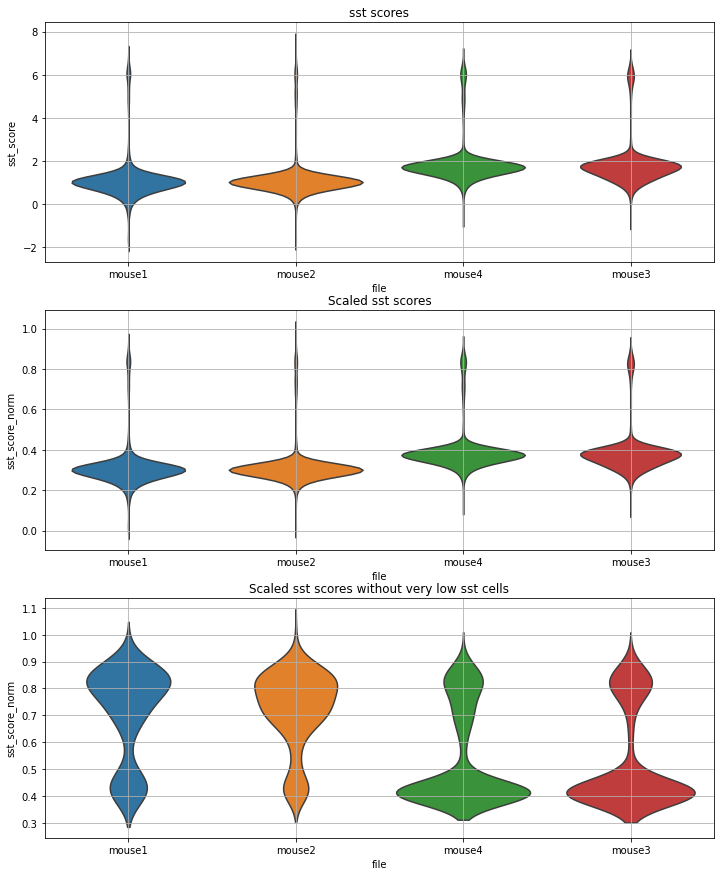

In [20]:
scores=adata_rawnorm.obs[[score_name+'_score','file']]
scores[score_name+'_score_norm']=pp.minmax_scale(scores[score_name+'_score'])
rcParams['figure.figsize']=(12,15)
fig,axs=plt.subplots(3,1)
sb.violinplot(x='file',y=score_name+'_score',data=scores,inner=None,ax=axs[0])
axs[0].title.set_text(score_name+' scores')
axs[0].grid()
sb.violinplot(x='file',y=score_name+'_score_norm',data=scores,inner=None,ax=axs[1])
axs[1].title.set_text('Scaled '+score_name+' scores')
axs[1].grid()
sb.violinplot(x='file',y=score_name+'_score_norm',data=scores[scores[score_name+'_score_norm']>0.4],
             inner=None,ax=axs[2])
axs[2].title.set_text('Scaled '+score_name+' scores without very low '+score_name+' cells')
axs[2].grid()

In [21]:
# Find score high cells
# Use different thresholds across files as there might be different ambient counts (or other effects), 
# thus shifting distributions up a bit
file_thresholds={'mouse1':0.55,'mouse2':0.55,'mouse4':0.55,'mouse3':0.6}
adata_rawnorm.obs[score_name+'_high']=scores.apply(lambda x: x[score_name+'_score_norm'] > file_thresholds[x.file], 
                                                   axis=1)
print('Proportion of '+score_name+' high across samples:')
adata_rawnorm.obs[['file',score_name+'_high']].groupby('file')[score_name+'_high'].value_counts(
    normalize=True,sort=False)

Proportion of sst high across samples:


file    sst_high
mouse1  False       0.959453
        True        0.040547
mouse2  False       0.960763
        True        0.039237
mouse4  False       0.926665
        True        0.073335
mouse3  False       0.933251
        True        0.066749
Name: sst_high, dtype: float64

In [22]:
# Add info about score high to main adata and save it
adata.obs[score_name+'_score']=adata_rawnorm.obs[score_name+'_score']
adata.obs[score_name+'_high']=adata_rawnorm.obs[score_name+'_high']

In [23]:
#### Ppy

In [24]:
genes=['Ppy']
score_name='ppy'

In [25]:
# Compute score
sc.tl.score_genes(adata_rawnorm, gene_list=genes, score_name=score_name+'_score',  use_raw=False)

<ipython-input-39-2b5c4e20aae6>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  scores[score_name+'_score_norm']=pp.minmax_scale(scores[score_name+'_score'])


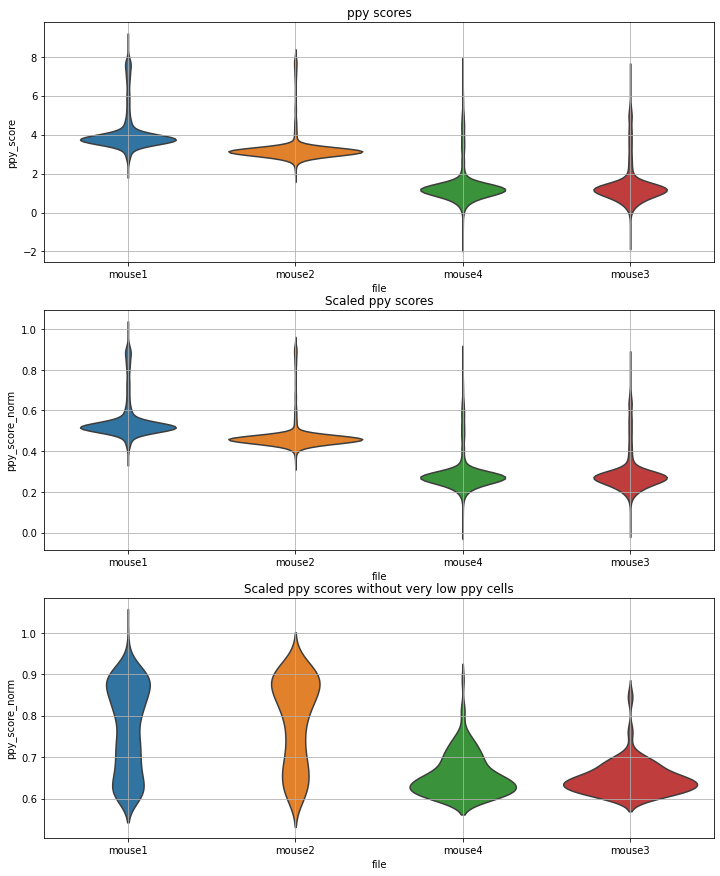

In [39]:
scores=adata_rawnorm.obs[[score_name+'_score','file']]
scores[score_name+'_score_norm']=pp.minmax_scale(scores[score_name+'_score'])
rcParams['figure.figsize']=(12,15)
fig,axs=plt.subplots(3,1)
sb.violinplot(x='file',y=score_name+'_score',data=scores,inner=None,ax=axs[0])
axs[0].title.set_text(score_name+' scores')
axs[0].grid()
sb.violinplot(x='file',y=score_name+'_score_norm',data=scores,inner=None,ax=axs[1])
axs[1].title.set_text('Scaled '+score_name+' scores')
axs[1].grid()
sb.violinplot(x='file',y=score_name+'_score_norm',data=scores[scores[score_name+'_score_norm']>0.6],
             inner=None,ax=axs[2])
axs[2].title.set_text('Scaled '+score_name+' scores without very low '+score_name+' cells')
axs[2].grid()

In [33]:
# Find score high cells
# Use different thresholds across files as there might be different ambient counts (or other effects), 
# thus shifting distributions up a bit
file_thresholds={'mouse1':0.77,'mouse2':0.77,'mouse4':0.85,'mouse3':0.8}
adata_rawnorm.obs[score_name+'_high']=scores.apply(lambda x: x[score_name+'_score_norm'] > file_thresholds[x.file], 
                                                   axis=1)
print('Proportion of '+score_name+' high across samples:')
adata_rawnorm.obs[['file',score_name+'_high']].groupby('file')[score_name+'_high'].value_counts(
    normalize=True,sort=False)

Proportion of ppy high across samples:


file    ppy_high
mouse1  False       0.915486
        True        0.084514
mouse2  False       0.967410
        True        0.032590
mouse4  False       0.999813
        True        0.000187
mouse3  False       0.999382
        True        0.000618
Name: ppy_high, dtype: float64

In [34]:
# Add info about score high to main adata and save it
adata.obs[score_name+'_score']=adata_rawnorm.obs[score_name+'_score']
adata.obs[score_name+'_high']=adata_rawnorm.obs[score_name+'_high']

#### Save

In [36]:
if SAVE:
    h.save_h5ad(adata, shared_folder+"data_annotated.h5ad",unique_id2=UID2)

## Clustering

#### Leiden clustering on log transformed data.

In [127]:
sc.tl.leiden(adata,resolution=0.4)

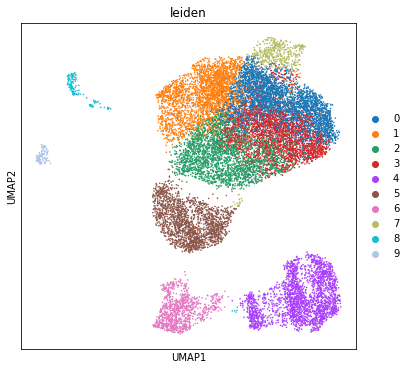

In [128]:
rcParams['figure.figsize']=(6,6)
sc.pl.umap(adata, color=['leiden'] ,size=10, use_raw=False)

#### Seurat style clustering

#### Leiden clustering on log transformed z-scaled data.

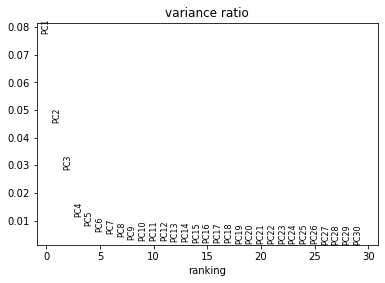

In [4]:
# Scale data and perform PCA
adata_scl=adata.copy()
sc.pp.scale(adata_scl,max_value=10)
sc.pp.pca(adata_scl, n_comps=30, use_highly_variable=True, svd_solver='arpack')
sc.pl.pca_variance_ratio(adata_scl)

In [8]:
#C: Can stay the same as above
N_PCS

15

In [6]:
# neighbours on scaled data
sc.pp.neighbors(adata_scl,n_pcs = N_PCS) 

In [62]:
# This neighbour weight computation (used in  Seurat) does not improve clustering - the main improvement is due to scaling
#snn.shared_knn_adata(adata,n_pcs=N_PCS,n_jobs=8)

In [7]:
# Umap on scaled data
sc.tl.umap(adata_scl)

In [9]:
# Add scaled embedding to adata
adata.obsm['X_umap_scl']=adata_scl.obsm['X_umap']

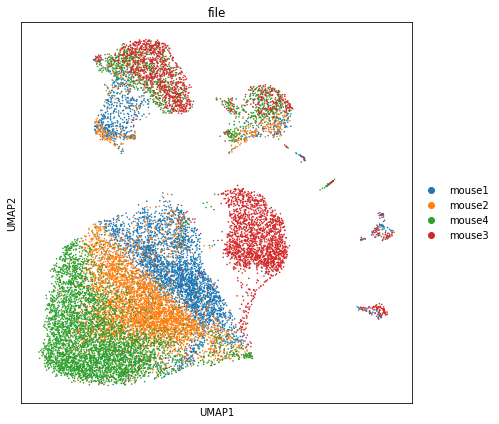

In [93]:
sc.pl.umap(adata_scl, color=['file'] ,size=10, use_raw=False,wspace=0.2)

In [133]:
# Clustering resolution
res=0.5

In [119]:
# Cluster scaled data
sc.tl.leiden(adata_scl, resolution=res, key_added='leiden_scaled_r'+str(res), directed=True, use_weights=True)

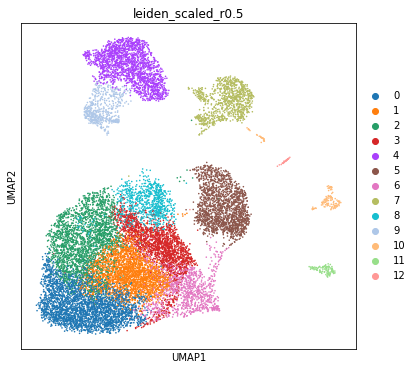

In [134]:
# Compare UMAPs and clusters on scaled data
rcParams['figure.figsize']=(6,6)
sc.pl.umap(adata_scl, color=['leiden_scaled_r'+str(res)] ,size=10, use_raw=False)

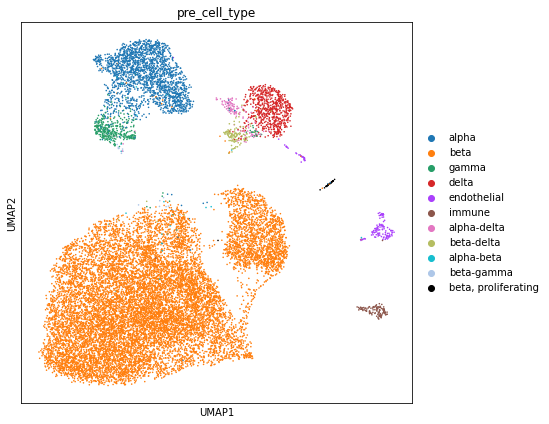

In [94]:
sc.pl.umap(adata_scl, color=['pre_cell_type'] ,size=10, use_raw=False)

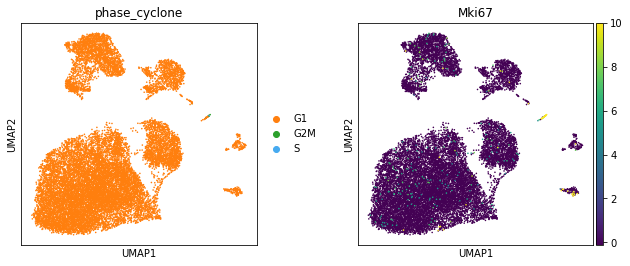

In [99]:
rcParams['figure.figsize']=(4,4)
sc.pl.umap(adata_scl, color=['phase_cyclone','Mki67'] ,size=10, use_raw=False,wspace=0.3)

#C: Based on z-scaled data there might be a proliferating subpopulation.

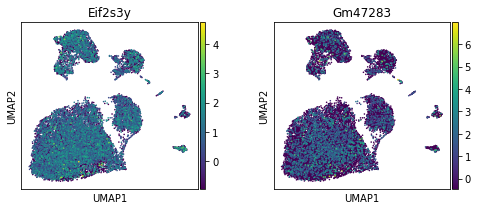

In [100]:
rcParams['figure.figsize']=(3,3)
sc.pl.umap(adata_scl, color=['Eif2s3y','Gm47283'] ,size=10, use_raw=False,wspace=0.3)

#C: Z-scaled data UMAP also does not show sex effects.

#C: As z-scaled data better separates proliferating subpopulation it will be used for further annotation.

## Cell type annotation

In [129]:
# Normalise raw data for plotting and cell type scoring
adata_raw=adata_scl.raw.to_adata().copy()
sc.pp.normalize_total(adata_raw, target_sum=1e4, exclude_highly_expressed=True,inplace=False)
sc.pp.log1p(adata_raw)
adata_rawnormalised=adata_scl.copy()
adata_rawnormalised.raw=adata_raw
del adata_raw

In [3]:
# Markers data
markers=pd.read_excel('/lustre/groups/ml01/workspace/karin.hrovatin/data/pancreas/gene_lists/markers.xlsx',
                          sheet_name='mice')

In [131]:
# Subset markers to non-immature and non-dedifferentiated for initial annotation
print('Subtypes (original):',markers.Subtype.unique())
remove_subtype=['immature','dedifferentiated']
remove_subtype=[]
markers_filter=markers.query('Subtype not in @remove_subtype')

Subtypes (original): ['mature' 'immature' nan 'dedifferentiated' 'activated' 'quiescent'
 'cytotoxic']


acinar
Missing genes: ['Ptf1a', 'Ce1', 'Rbpj1']


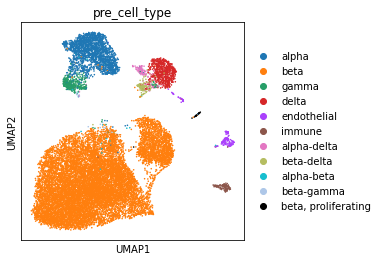

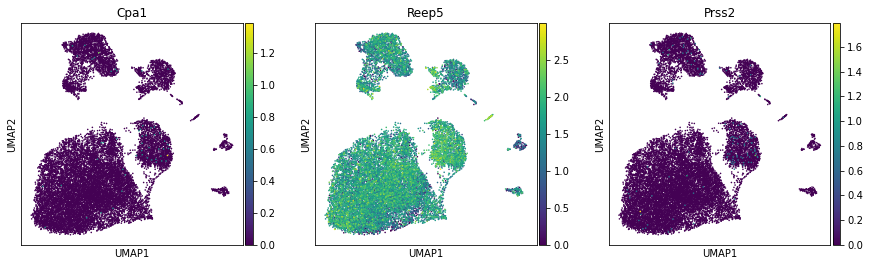

alpha
Missing genes: []


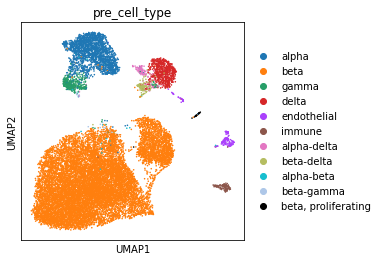

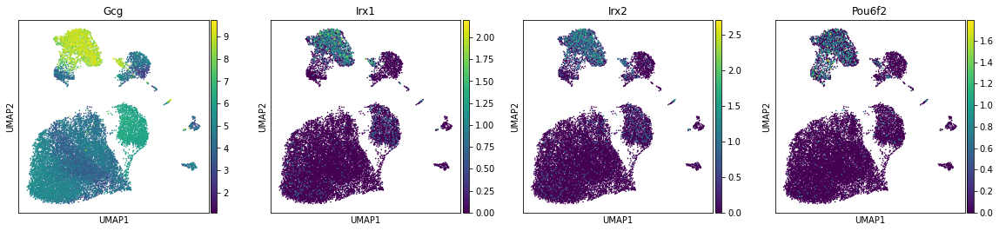

B immune
Missing genes: ['Cd79b']


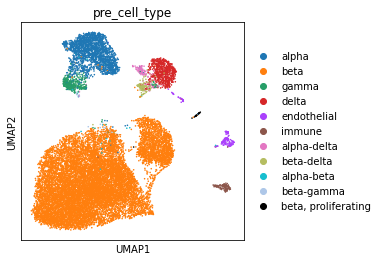

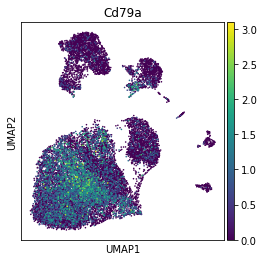

beta
Missing genes: ['Glut2', 'MafA', 'Pax4']


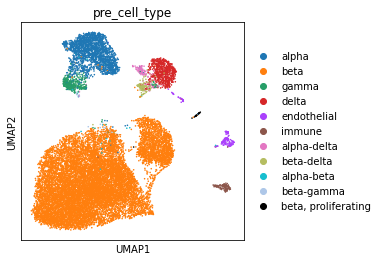

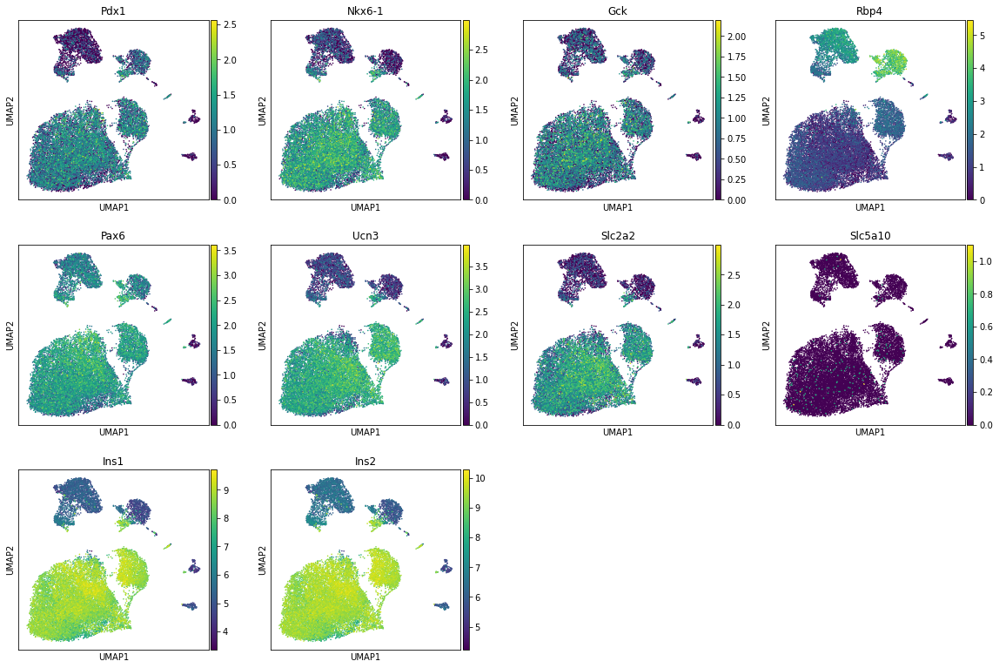

delta
Missing genes: []


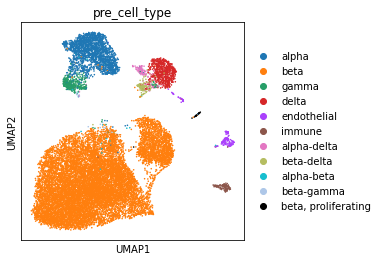

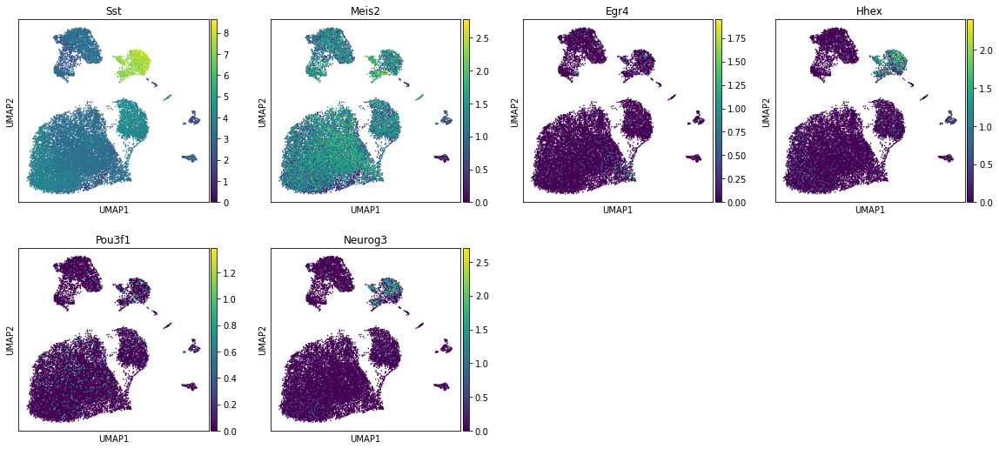

dendritic
Missing genes: ['Iftim3']


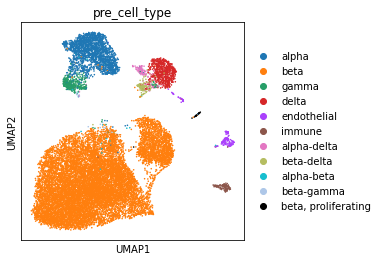

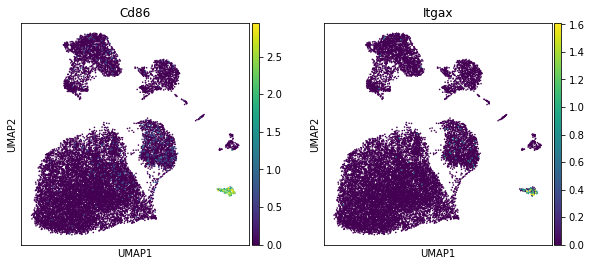

ductal
Missing genes: ['Ca2']


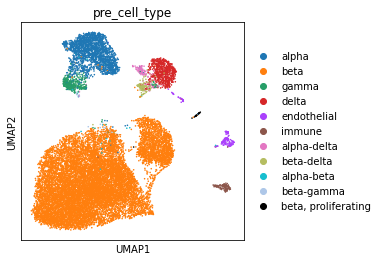

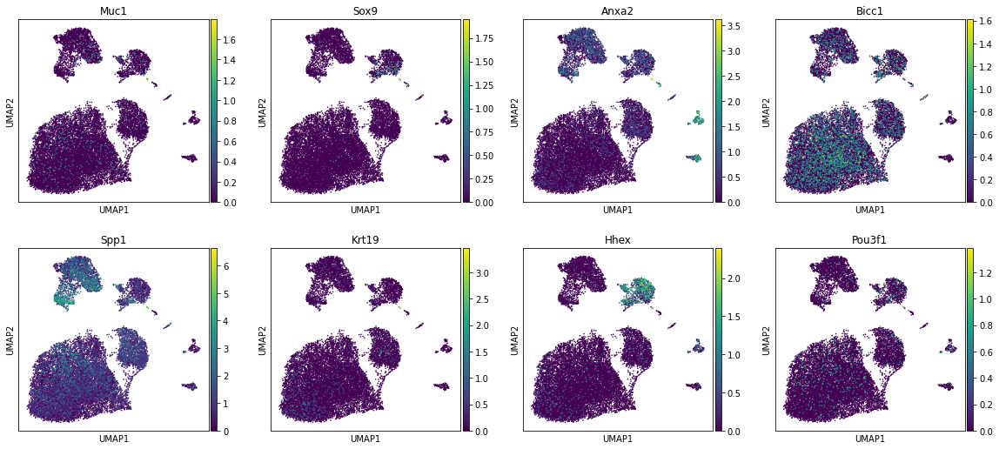

endocrine
Missing genes: ['Neurod2']


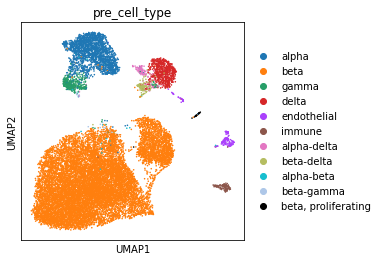

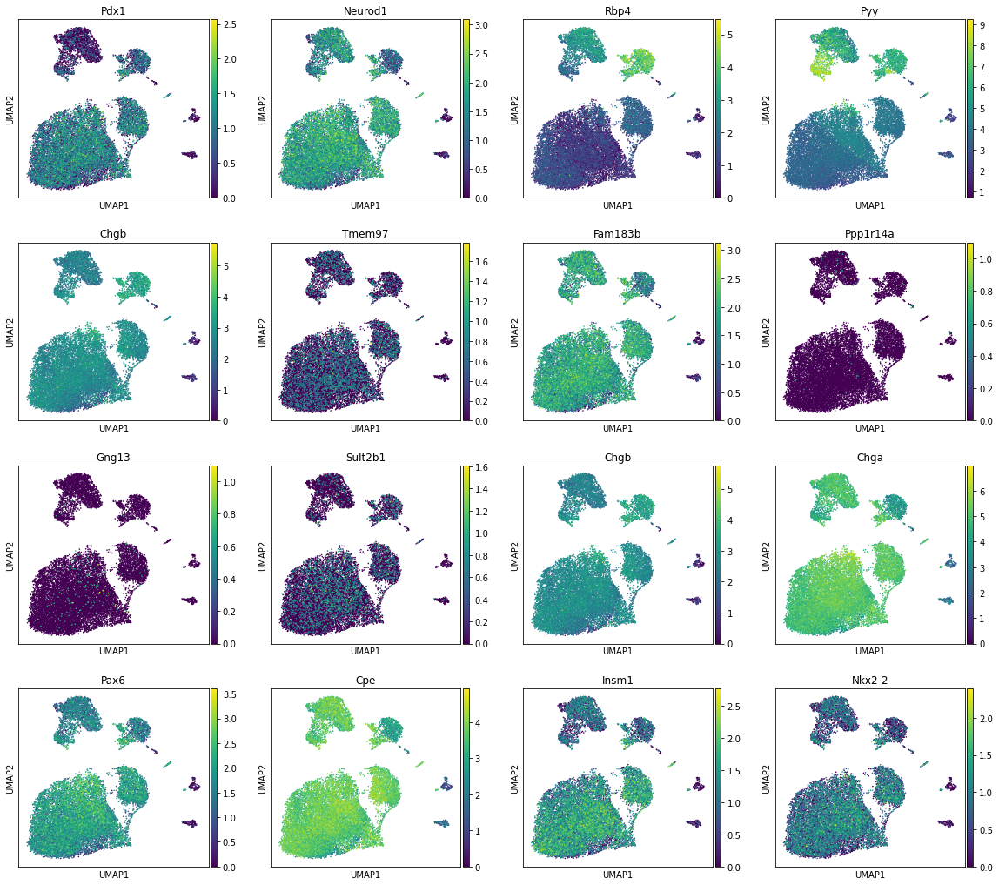

endothelial
Missing genes: []


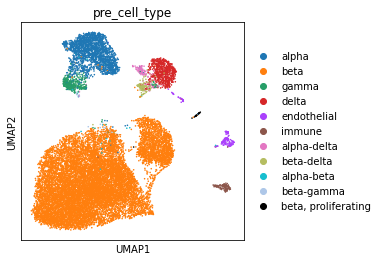

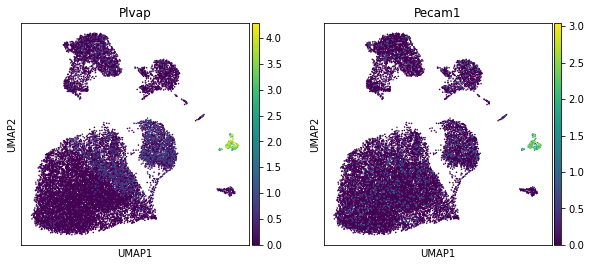

EP
Missing genes: ['Ngn3']


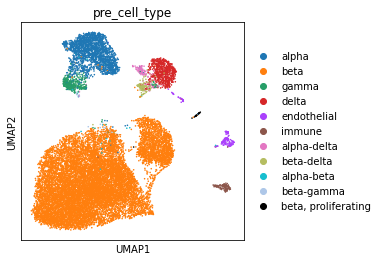

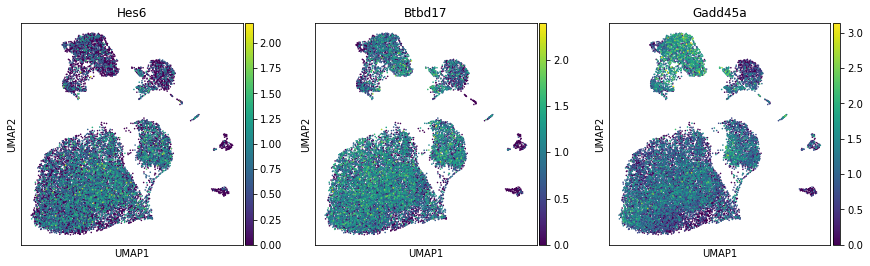

epithelial
Missing genes: []


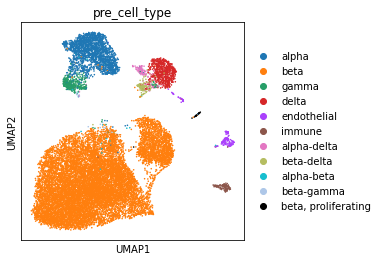

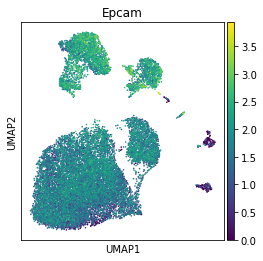

epsilon
Missing genes: []


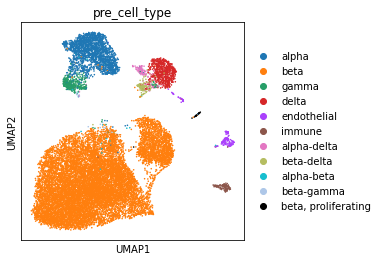

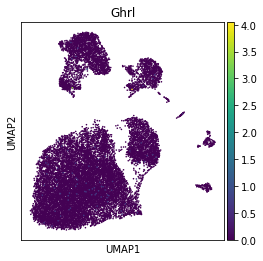

gamma
Missing genes: []


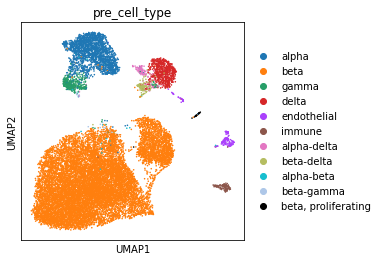

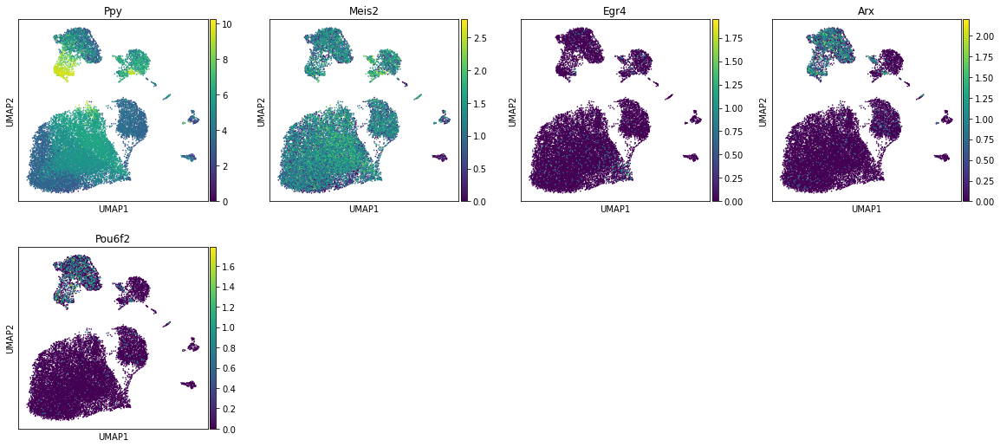

immune
Missing genes: []


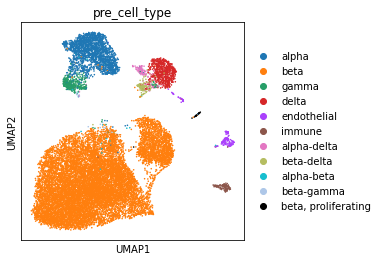

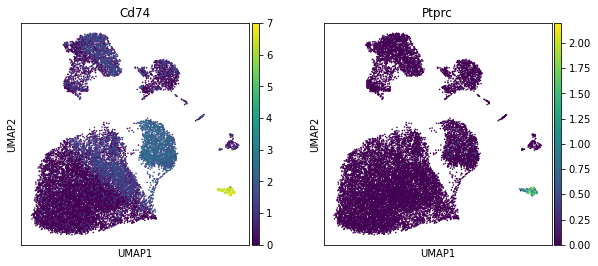

lymphocye
Missing genes: []


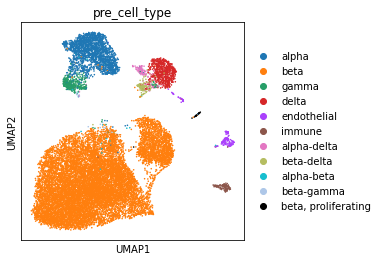

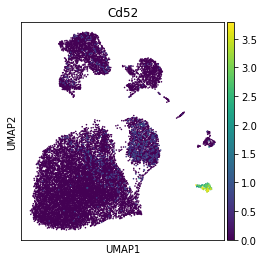

macrophage
Missing genes: []


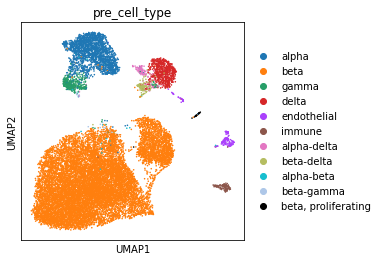

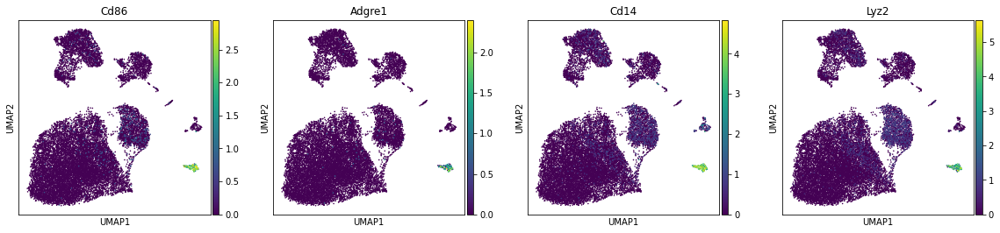

MPC
Missing genes: ['Bft3']


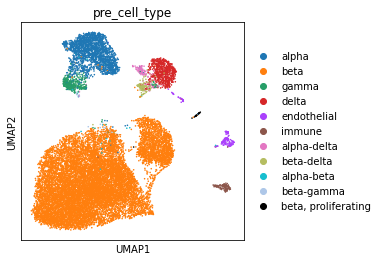

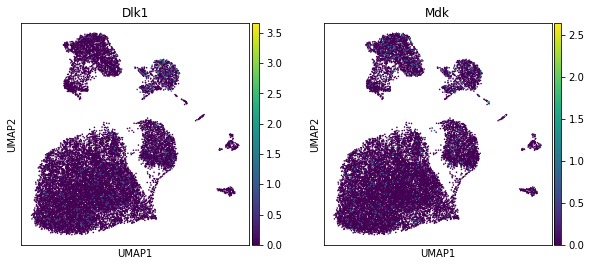

pericyte
Missing genes: ['Cspg4']


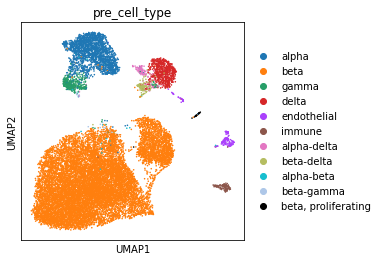

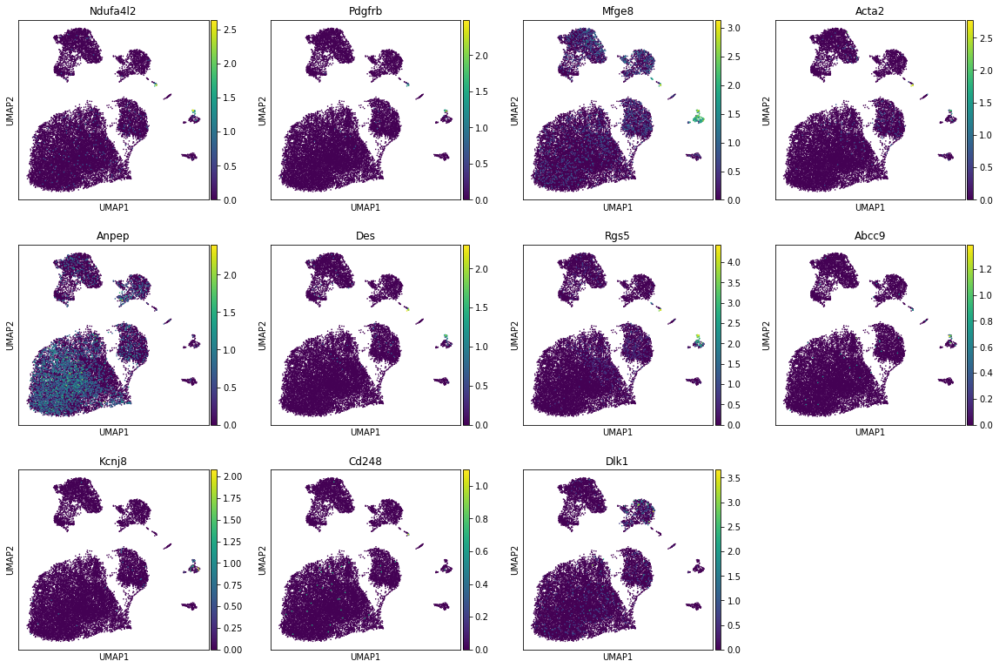

schwann
Missing genes: ['Sox10', 'Cmtm5']


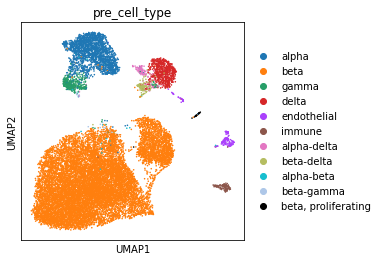

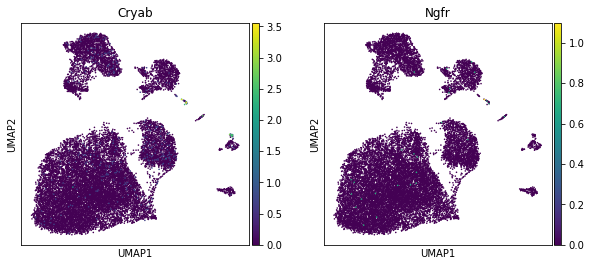

stellate
Missing genes: ['Pdgfra']


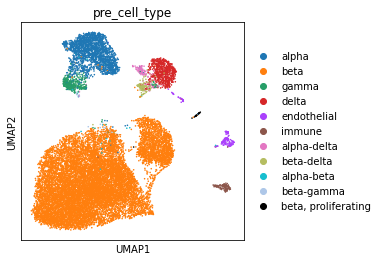

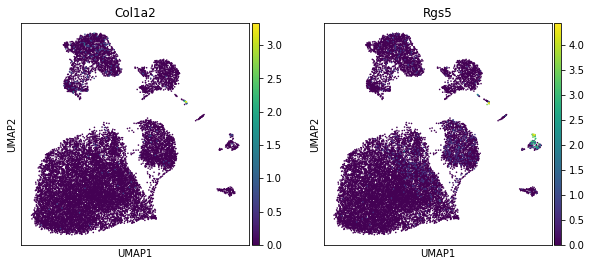

T immune
Missing genes: ['Cd8a', 'Cd3d']


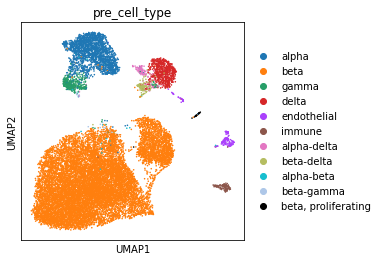

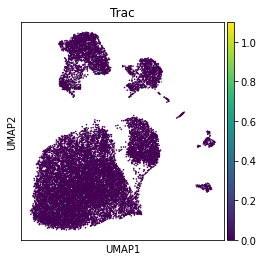

tip
Missing genes: []


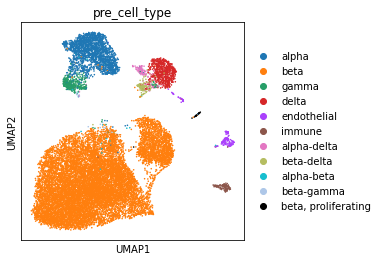

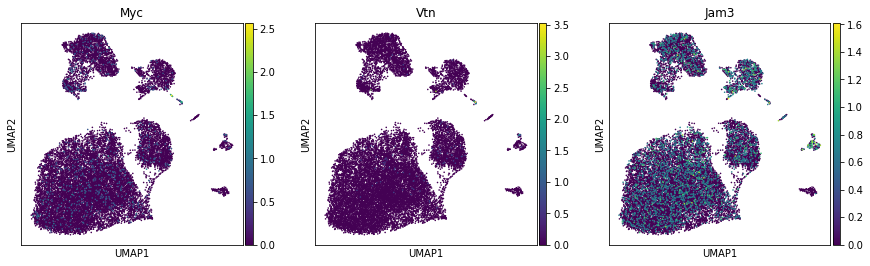

trunk
Missing genes: []


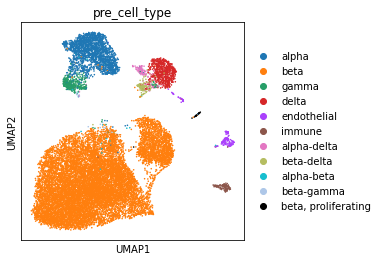

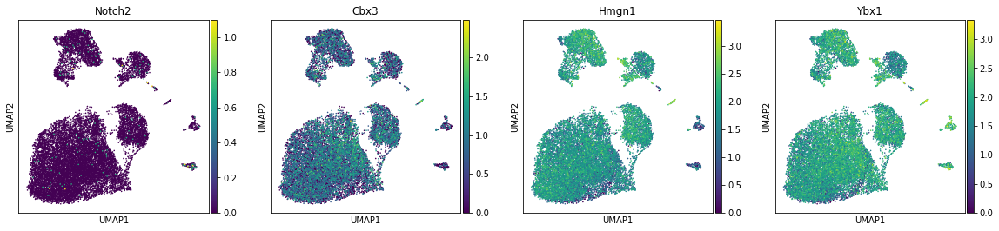

In [136]:
# Plot markers for each cell type
for cell_type in sorted(list(markers_filter.Cell.unique()), key=str.lower):
    print(cell_type)
    genes=list(markers_filter.query('Cell == "'+cell_type+'"').Gene)
    # Retain genes present in raw var_names
    missing=[gene for gene in genes if gene not in adata.raw.var_names]
    genes=[gene for gene in genes if gene in adata.raw.var_names]
    if len(genes)>0:
        print('Missing genes:',missing)
        rcParams['figure.figsize']=(4,4)
        sc.pl.umap(adata_rawnormalised, color=['pre_cell_type'],size=10, use_raw=True)
        sc.pl.umap(adata_rawnormalised, color=genes ,size=10, use_raw=True)
    else:
        print('No availiable genes (out of:',missing,')\n')

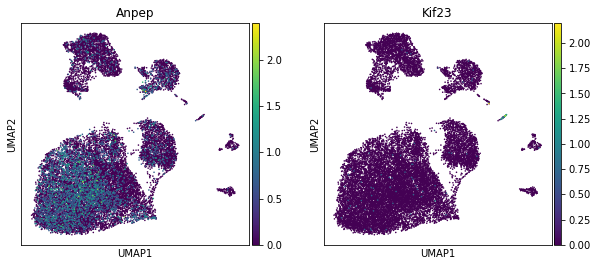

In [151]:
rcParams['figure.figsize']=(4,4)
sc.pl.umap(adata_rawnormalised, color=['Anpep','Kif23'] ,size=10, use_raw=True)

#C: Expression of schwann and stellate genes was compared to another dataset (Fltp_P16), where it is more evident that those cells are present. Based on this it seems that schwann and stellate are absent in this dataset.

In [167]:
# Selected markers that seem to be able to distinguish between cell types
# Use only hormone genes for endocrine cells
markers_selection={
'immune':['Cd86','Cd74','Ptprc','Cd14','Cd86','Lyz2'],
'endothelial':['Plvap','Pecam1'],
'pericyte':['Ndufa4l2','Pdgfrb','Acta2','Des','Rgs5','Abcc9'],
'ductal':['Muc1','Sox9','Anxa2','Krt19'],
'alpha':['Gcg'],
'beta':['Ins1','Ins2'],
'delta':['Sst'],
'gamma':['Ppy']
}

#markers_selection={
#'immune':['Cd74','Ptprc','Cd86','Adgre1','Lyz2','Cd86','Itgax','Cd52'],
#'schwann':['Sox10'],
#'stellate':['Col1a2','Pdgfra'],
#'endothelial':['Plvap','Pecam1'],
#'ductal':['Muc1','Sox9','Spp1','Krt19'],
#'acinar':['Cpa1','Prss2'],
#'beta':['Slc2a2','Ins1','Ins2'],
#'alpha':['Gcg','Irx1','Irx2'],
#'delta':['Sst','Hhex','Neurog3'],
#'gamma':['Ppy'],
#'epsilon':['Ghrl']
#}

### Marker expression scores
Score each cell for marker expression of each cell type. Cells can thus be annotated qith 0 to N cell types. The presence of annotations is then checked for each cluster.

In [169]:
#Score cells for each cell type

# Save score column names 
scores=[]
for cell_type,genes in markers_selection.items():
    score_name=cell_type+'_score'
    scores.append(cell_type+'_score')
    sc.tl.score_genes(adata_rawnormalised, gene_list=genes, score_name=score_name,  use_raw=True)

In [170]:
# Which clusters (column name) to analyse for cell scores
res=0.5
clusters_col='leiden_scaled_r'+str(res)

In [171]:
# Add cluster information to the used adata
adata_rawnormalised.obs[clusters_col]=adata_scl.obs[clusters_col]

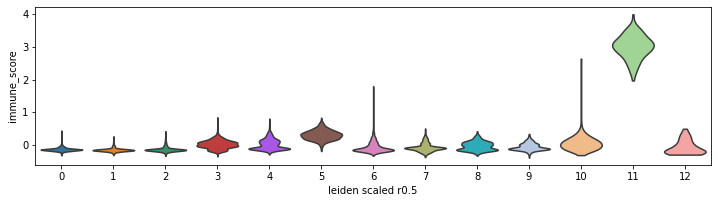

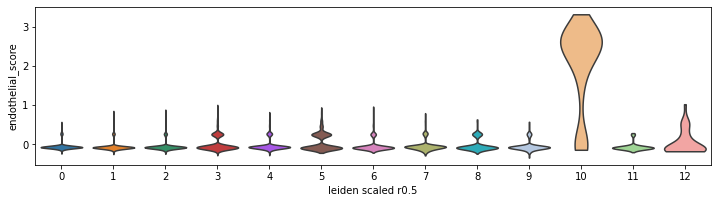

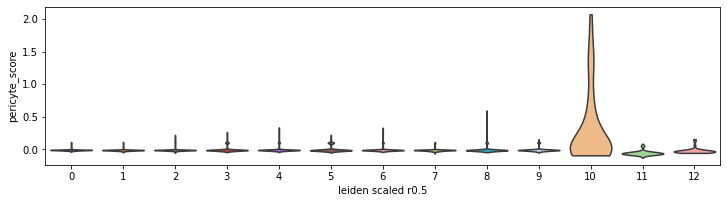

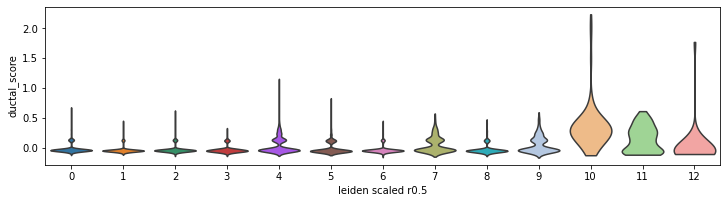

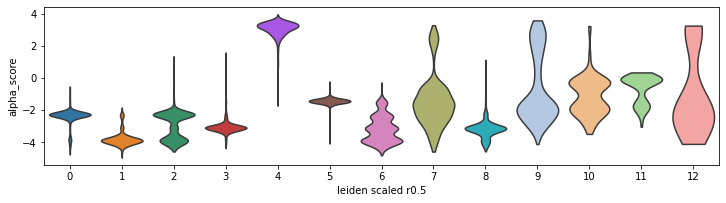

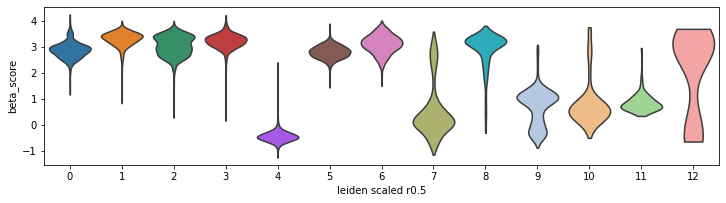

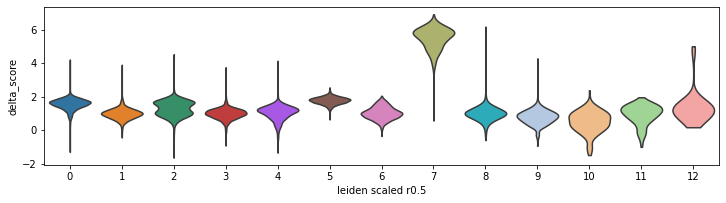

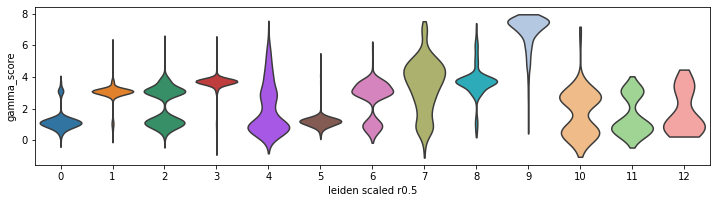

In [172]:
# Plot scores distribution across clusters
rcParams['figure.figsize']=(10,3)
for score in scores:
    sc.pl.violin(adata_rawnormalised, keys=score, groupby=clusters_col, use_raw=True, stripplot=False)

In [ ]:
# Scores per cluster, scaled from 0 to 1 in each cell type
#C: Not very informative!
#scores_df=adata_rawnormalised.obs[scores+[clusters_col]]
#score_means=scores_df.groupby(clusters_col).mean()
#score_means=pd.DataFrame(pp.minmax_scale(score_means),index=score_means.index,columns=score_means.columns)
#sb.clustermap(score_means,yticklabels=1)

In [173]:
# Scores normalised to interval [0,1] for each cell type - so that they can be more easily compared
scores_df_norm=adata_rawnormalised.obs[scores]
scores_df_norm=pd.DataFrame(pp.minmax_scale(scores_df_norm),columns=scores_df_norm.columns,index=adata_rawnormalised.obs.index)

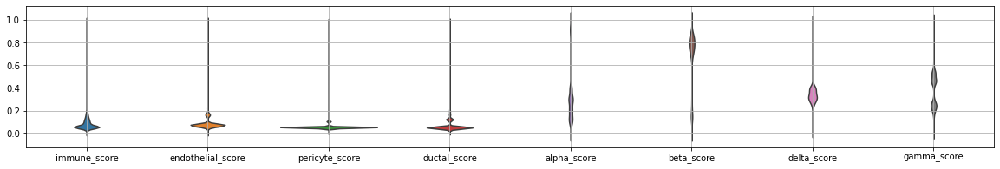

In [174]:
# Plot of normalised scores distribution in whole dataset, per cluster
rcParams['figure.figsize']=(20,3)
fig,ax=plt.subplots()
sb.violinplot(data=scores_df_norm,inner=None,ax=ax)
ax.grid()

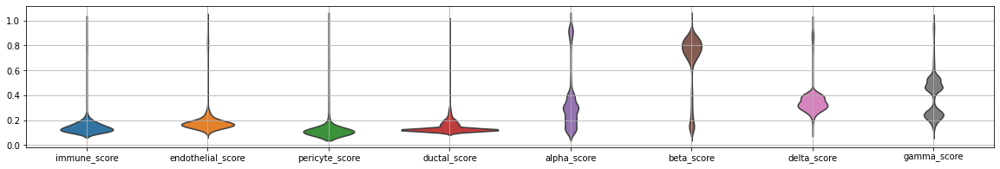

In [175]:
# Plot of normalised scores distribution, excluding low scores, per cluster
rcParams['figure.figsize']=(20,3)
fig,ax=plt.subplots()
sb.violinplot(data=scores_df_norm[scores_df_norm>0.1],inner=None,ax=ax)
ax.grid()

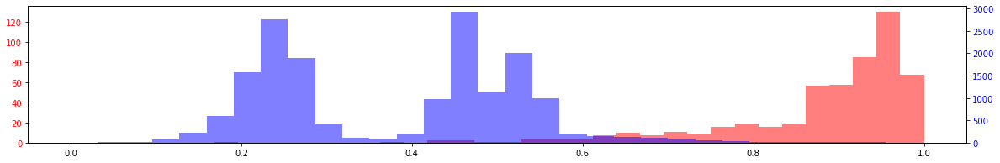

In [182]:
# Check gamma score in gamma cluster to reset the threshold
fig,ax1=plt.subplots()
a=ax1.hist(scores_df_norm.gamma_score[(adata_scl.obs[clusters_col]=='9').values],bins=30,alpha=0.5,color='r')
ax1.tick_params(axis='y', labelcolor='r')
ax2 = ax1.twinx()
a=ax2.hist(scores_df_norm.gamma_score[(adata_scl.obs[clusters_col]!='9').values],bins=30,alpha=0.5,color='b')
ax2.tick_params(axis='y', labelcolor='b')

In [187]:
# Thresholds for cell type assignemnt based on normalised scores
thresholds=[]
for col in scores_df_norm:
    threshold=0.4
    if col=='gamma_score':
        threshold=0.8
    elif col=='alpha_score':
        threshold=0.6
    elif col=='beta_score':
        threshold=0.5
    elif col =='delta_score' :
        threshold=0.6
    thresholds.append(threshold)

In [188]:
# Assign cell types based on scores to each cell
assignment_df=scores_df_norm>=thresholds
assignment_df.columns=[col.replace('_score','') for col in scores_df_norm.columns] 

In [189]:
# Count of cells per cell type
assignment_df[[col.replace('_score','') for col in scores_df_norm.columns]].sum()

immune           112
endothelial      119
pericyte          27
ductal            11
alpha           2105
beta           13943
delta            958
gamma            527
dtype: int64

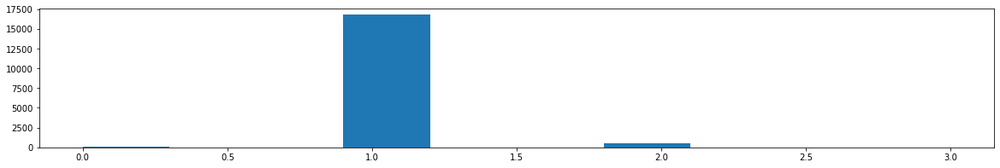

In [186]:
# How many cell types were annotated to each cell
a=plt.hist(assignment_df.sum(axis=1))

In [190]:
# For each cell make a (standard) string of annotated cell types: 
# e.g. each annotated cell type in the same order, separated by '_' when multiple cell types were annotated
type_unions=[]
for idx,row in assignment_df.iterrows():
    type_union=''
    for col in row.index:
        if row[col]:
            type_union=type_union+col+'_'
    if type_union=='':
        type_union='NA'
    type_unions.append(type_union.rstrip('_'))

In [191]:
# Add cell types strings of cells to scores/assignment DF
assignment_df['type_union']=type_unions
assignment_df[clusters_col]=adata_rawnormalised.obs[clusters_col].values

### Annotate clusters

In [4]:
def add_category(df,idxs,col,category):
    """
    Add single value to multiple rows of DF column (useful when column might be categorical). 
    If column is categorical the value is beforehand added in the list of present categories 
    (required for categorical columns). 
    :param df: DF to which to add values
    :param idxs: Index names of rows where the value should be assigned to the column.
    :param col: Column to which to add the value.
    :param category: The value to add to rows,column.
    """
    # If column is already present, is categorical and value is not in categories add the value to categories first.
    if col in df.columns and df[col].dtype.name=='category' and category not in df[col].cat.categories:
        df[col] = df[col].cat.add_categories([category])
    df.loc[idxs,col]=category

In [193]:
# Make DF of marker gene expressions (normalised, log transformed), scaled for each gene to [0,1]
used_markers=list(dict.fromkeys([marker for marker_list in markers_selection.values() for marker in marker_list]))
gene_idx=adata_rawnormalised.raw.var_names.isin(used_markers)
genes=adata_rawnormalised.raw.var_names[gene_idx]
scaled_expression=pd.DataFrame(pp.minmax_scale(adata_rawnormalised.raw.X.toarray()[:, gene_idx]),
                               columns=genes,index=adata_rawnormalised.obs.index
                              )[[marker for marker in used_markers if marker in genes]]


def subcluster(adata_cluster,res,original_cluster,assignment_df_temp,clusters_name_prefix='leiden_scaled_r'):
    """
    Cluster adata and add reult into cell type assignment DF. Plot the clustering on UMAP.
    Add name of the original cluster to which the adata belongs to new cluster names.
    Cluster column name: clusters_name_prefix+str(res) 
    :param adata_cluster: Adata (with already computed neighbours and UMAP) to cluster with leiden clustering. 
    :param res: Leiden resolution
    :param original_cluster: Original cluster name, new clusters are named 'original cluster'+'_'+'new cluster'
    :param assignment_df_temp: assignment_df to which to add clusters - should have same row order as adata
    :param clusters_name_prefix: Prefix for cluster column name.
    """
    clusters_col_name=clusters_name_prefix+str(res)
    sc.tl.leiden(adata_cluster, resolution=res, key_added=clusters_col_name, directed=True, use_weights=True)
    adata_cluster.obs[clusters_col_name]=[original_cluster+'_'+subcluster 
                                                 for subcluster in adata_cluster.obs[clusters_col_name]]
    sc.pl.umap(adata_cluster,color=clusters_col_name)
    time.sleep(1.0)
    
    assignment_df_temp['leiden_scaled_r'+str(res)]=adata_cluster.obs['leiden_scaled_r'+str(res)].values
    
def get_cluster_data(adata_original, cluster,cluster_col,assignment_df):
    """
    Subset adata and assignment_df to cluster.
    :param adata_original: Adata to subset.
    :param  cluster: Cluster for which to extract the data.
    :param cluster_col: Column where clusters are listed. Should be present in adata and assignment_df.
    :param assignment_df: DF with cell type assignmnets in column 'type_union' and cluster info. Should have index names
    that are present in adata.obs.index.
    :return: Subset of adata, assignment_df
    """
    adata_temp=adata_original[adata_original.obs[cluster_col]==cluster].copy()
    assignment_df_temp=pd.DataFrame(assignment_df.loc[adata_temp.obs.index,'type_union'])
    return adata_temp, assignment_df_temp

def cluster_annotate(assignment_df,cluster_col,present_threshold,nomain_threshold,
                     save,cluster_annotation,adata_main):
    """
    Loop through clusters, check present cell types and if there is no main cell type plot expression and QC metrics.
    For each cluster list proportion of present cell types.
    Expression (normalised, log transformed, [0,1] per gene scaled) is plotted for marker genes across cells (heatmap).
    QC metrics are plotted as scatterplot of N genes and N counts with cluster cells overlayed over all cels.
    :param assignment_df: DF with cell type assignment in column 'type_union' and cluster assignment.
    :param cluster_col: Cluster column name in assignment_df.
    :param present_threshold: Count among present cell types each cell type present if it represents 
    at least present_threshold proportion of cells in cluster. 
    :param nomain_threshold: If only 1 cell type was selected with present_threshold and 
    no cell type is present at proportion at least nomain_threshold add 'other' to annotated cell types list.
    :param save: Save cluster information to adata_main (column 'cluster') and cell types list to cluster_annotation.
    :param cluster_annotation: Dict where each cluster (key) has list of annotated cell types (value).
    :param adata_main: Add cluster to adata_main.obs.cluster. Use this adata for plotting of QC mettrics (for this a
    column 'temp_selected' is added.)
    """
    for group in assignment_df[['type_union',cluster_col]].groupby(cluster_col):
        types_summary=group[1].type_union.value_counts(normalize=True)
        present=list(types_summary[types_summary >= present_threshold].index)
        if len(present)==1 and types_summary.max() < nomain_threshold:
            present.append('other')
            
        if save:
            cluster_annotation[group[0]]=present
            add_category(df=adata_main.obs,idxs=group[1].index,col='cluster',category=group[0])
        
        print('\nCluster:',group[0],'\tsize:',group[1].shape[0])    
        print('Present:',present)
        print(types_summary)
        
        #present_nonna=[cell_type for cell_type in present if cell_type !='NA']
        #if len(present_nonna)!=1:
        if len(present)!=1 or present==['NA']:
            sb.clustermap(
                pd.DataFrame(scaled_expression.loc[group[1].index,:]),
                col_cluster=False,xticklabels=1,yticklabels=False,figsize=(7,5))
            plt.title('Cluster: '+group[0]+' assigned:'+str(present))
            adata_main.obs['temp_selected']=adata_main.obs.index.isin(group[1].index)
            rcParams['figure.figsize']=(5,5)
            p1 = sc.pl.scatter(adata_main, 'n_counts', 'n_genes', color='temp_selected', size=40,color_map='viridis')
            time.sleep(1.0)



In [206]:
#Save cell types annotated to each cluster
cluster_annotation=dict()


Cluster: 0 	size: 3032
Present: ['beta']
beta          0.998681
NA            0.000660
beta_delta    0.000660
Name: type_union, dtype: float64

Cluster: 1 	size: 2721
Present: ['beta']
beta          0.998897
beta_gamma    0.000368
NA            0.000368
beta_delta    0.000368
Name: type_union, dtype: float64

Cluster: 2 	size: 2290
Present: ['beta']
beta          0.995633
alpha_beta    0.001310
beta_delta    0.001310
NA            0.000873
beta_gamma    0.000873
Name: type_union, dtype: float64

Cluster: 3 	size: 2037
Present: ['beta']
beta          0.997054
alpha_beta    0.000982
beta_gamma    0.000982
NA            0.000491
beta_delta    0.000491
Name: type_union, dtype: float64

Cluster: 4 	size: 1828
Present: ['alpha']
alpha               0.981400
alpha_gamma         0.007659
NA                  0.005470
alpha_beta          0.003282
beta                0.000547
alpha_beta_delta    0.000547
alpha_delta         0.000547
ductal_alpha        0.000547
Name: type_union, dtype: float64



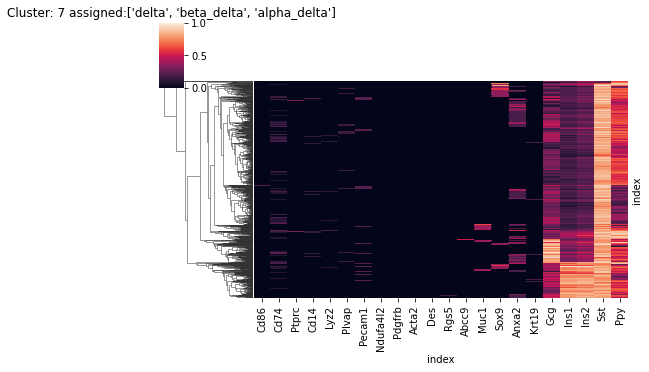

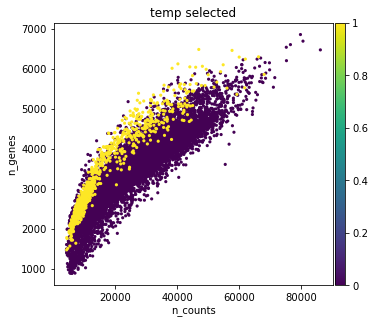


Cluster: 8 	size: 832
Present: ['beta']
beta                0.921875
NA                  0.038462
beta_gamma          0.016827
gamma               0.009615
beta_delta          0.008413
alpha_beta          0.002404
alpha_beta_gamma    0.001202
delta               0.001202
Name: type_union, dtype: float64

Cluster: 9 	size: 527
Present: ['gamma', 'alpha_gamma', 'alpha']
gamma               0.624288
alpha_gamma         0.163188
alpha               0.146110
beta_gamma          0.036053
NA                  0.022770
beta_delta_gamma    0.001898
beta                0.001898
delta_gamma         0.001898
alpha_beta          0.001898
Name: type_union, dtype: float64


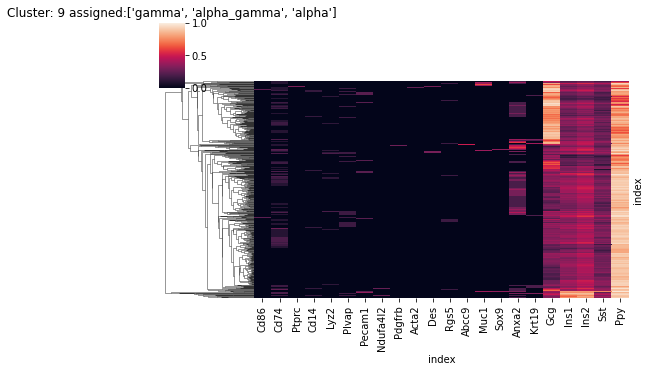

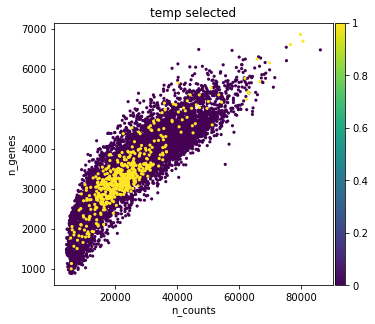


Cluster: 10 	size: 147
Present: ['endothelial', 'endothelial_pericyte']
endothelial                0.557823
endothelial_pericyte       0.136054
endothelial_beta           0.074830
beta                       0.047619
pericyte                   0.040816
ductal                     0.040816
NA                         0.034014
endothelial_gamma          0.013605
ductal_alpha               0.013605
endothelial_alpha_gamma    0.006803
pericyte_beta              0.006803
immune_endothelial         0.006803
endothelial_alpha_beta     0.006803
alpha                      0.006803
endothelial_alpha          0.006803
Name: type_union, dtype: float64


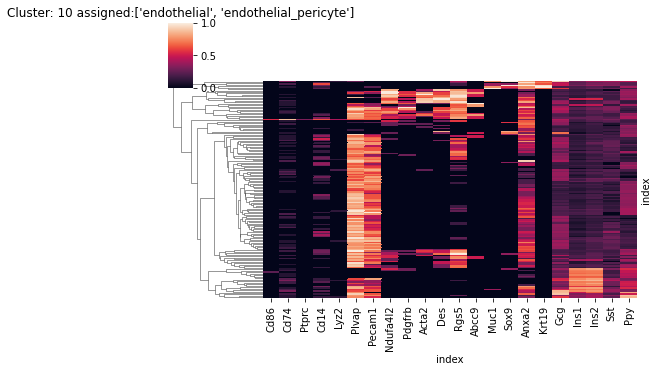

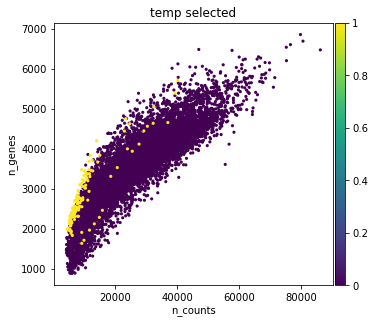


Cluster: 11 	size: 110
Present: ['immune']
immune         0.954545
immune_beta    0.045455
Name: type_union, dtype: float64

Cluster: 12 	size: 35
Present: ['beta', 'alpha']
beta           0.685714
alpha          0.228571
alpha_delta    0.028571
ductal         0.028571
delta          0.028571
Name: type_union, dtype: float64


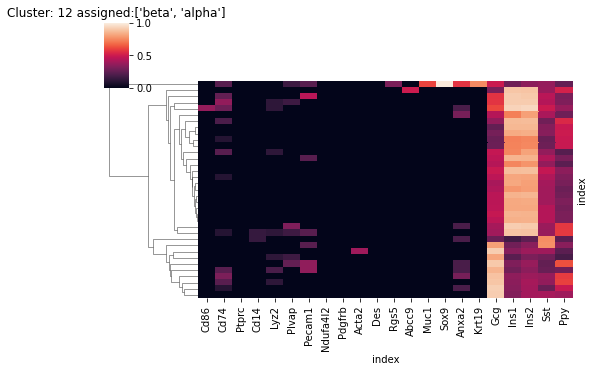

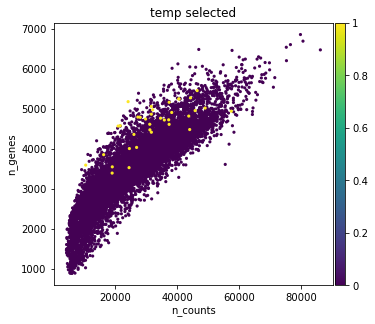

In [224]:
# Display cell type annotation distribution of each cluster.
cluster_annotate(assignment_df=assignment_df,
                 cluster_col=clusters_col,present_threshold=0.1,nomain_threshold=0.9,
                     save=True,cluster_annotation=cluster_annotation,adata_main=adata_rawnormalised)

**** Original cluster 7


... storing 'leiden_scaled_r0.3' as categorical


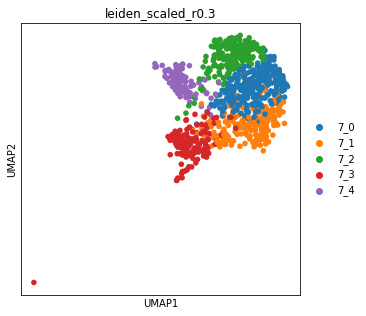


Cluster: 7_0 	size: 290
Present: ['delta']
delta          0.968966
beta_delta     0.017241
NA             0.010345
alpha_delta    0.003448
Name: type_union, dtype: float64

Cluster: 7_1 	size: 223
Present: ['delta', 'delta_gamma']
delta                0.757848
delta_gamma          0.156951
beta_delta           0.031390
beta_delta_gamma     0.017937
alpha_delta_gamma    0.013453
alpha_delta          0.008969
NA                   0.008969
gamma                0.004484
Name: type_union, dtype: float64


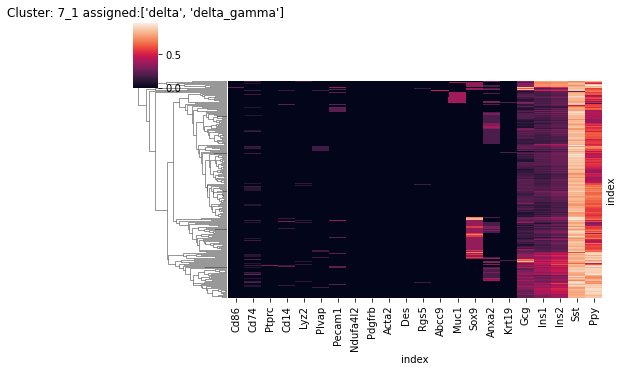

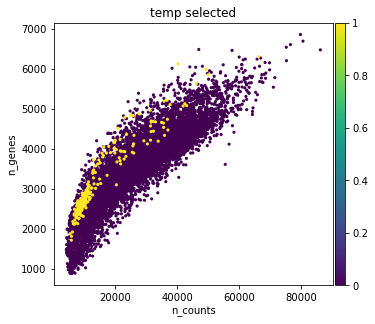

... storing 'leiden_scaled_r0.3' as categorical



Cluster: 7_2 	size: 197
Present: ['delta']
delta          0.944162
beta_delta     0.045685
alpha_delta    0.005076
NA             0.005076
Name: type_union, dtype: float64

Cluster: 7_3 	size: 145
Present: ['beta_delta']
beta_delta          0.889655
delta               0.041379
NA                  0.034483
beta                0.027586
beta_delta_gamma    0.006897
Name: type_union, dtype: float64

Cluster: 7_4 	size: 98
Present: ['alpha_delta']
alpha_delta          0.948980
delta                0.040816
alpha_delta_gamma    0.010204
Name: type_union, dtype: float64
**** Original cluster 9


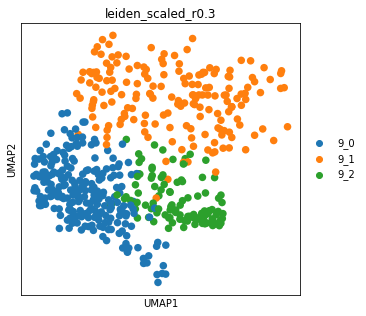


Cluster: 9_0 	size: 246
Present: ['gamma']
gamma               0.865854
beta_gamma          0.069106
alpha_gamma         0.048780
beta_delta_gamma    0.004065
alpha_beta          0.004065
NA                  0.004065
delta_gamma         0.004065
Name: type_union, dtype: float64

Cluster: 9_1 	size: 177
Present: ['alpha', 'alpha_gamma', 'gamma']
alpha          0.435028
alpha_gamma    0.378531
gamma          0.124294
NA             0.056497
beta           0.005650
Name: type_union, dtype: float64


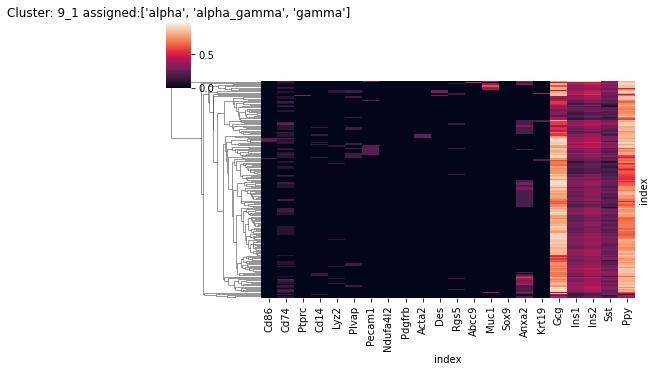

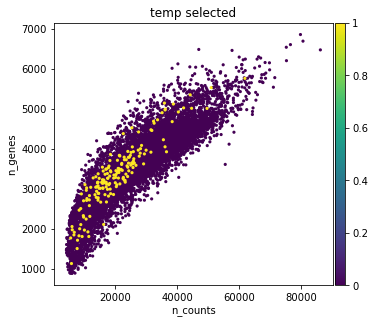

... storing 'leiden_scaled_r0.3' as categorical



Cluster: 9_2 	size: 104
Present: ['gamma']
gamma          0.903846
alpha_gamma    0.067308
beta_gamma     0.019231
NA             0.009615
Name: type_union, dtype: float64
**** Original cluster 10


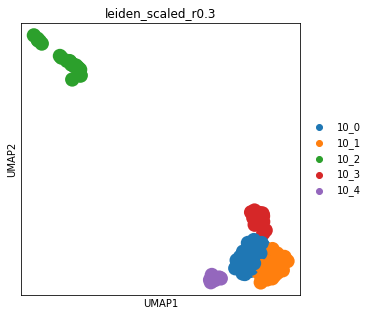


Cluster: 10_0 	size: 51
Present: ['endothelial']
endothelial          0.901961
endothelial_beta     0.058824
endothelial_gamma    0.019608
endothelial_alpha    0.019608
Name: type_union, dtype: float64

Cluster: 10_1 	size: 38
Present: ['endothelial']
endothelial             0.921053
endothelial_pericyte    0.026316
immune_endothelial      0.026316
endothelial_beta        0.026316
Name: type_union, dtype: float64

Cluster: 10_2 	size: 28
Present: ['beta', 'pericyte', 'ductal', 'NA']
beta             0.250000
pericyte         0.214286
ductal           0.214286
NA               0.178571
ductal_alpha     0.071429
pericyte_beta    0.035714
alpha            0.035714
Name: type_union, dtype: float64


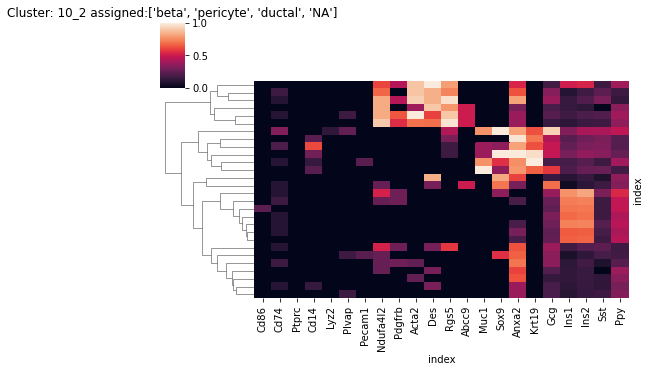

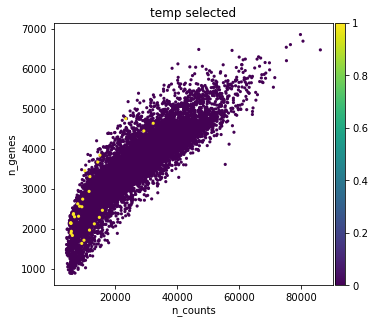


Cluster: 10_3 	size: 20
Present: ['endothelial_pericyte']
endothelial_pericyte    0.95
endothelial             0.05
Name: type_union, dtype: float64

Cluster: 10_4 	size: 10
Present: ['endothelial_beta', 'endothelial_alpha_gamma', 'endothelial_gamma', 'endothelial_alpha_beta']
endothelial_beta           0.7
endothelial_alpha_gamma    0.1
endothelial_gamma          0.1
endothelial_alpha_beta     0.1
Name: type_union, dtype: float64


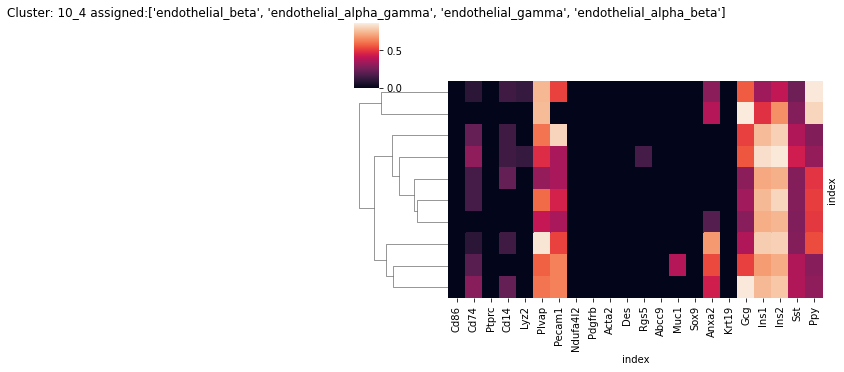

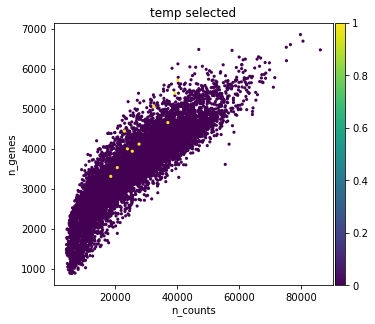

... storing 'leiden_scaled_r0.3' as categorical


**** Original cluster 12


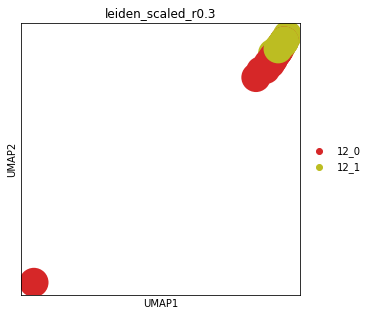


Cluster: 12_0 	size: 24
Present: ['beta']
beta    1.0
Name: type_union, dtype: float64

Cluster: 12_1 	size: 11
Present: ['alpha', 'other']
alpha          0.727273
alpha_delta    0.090909
ductal         0.090909
delta          0.090909
Name: type_union, dtype: float64


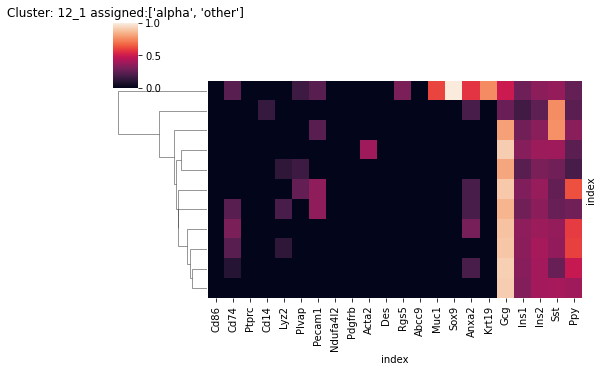

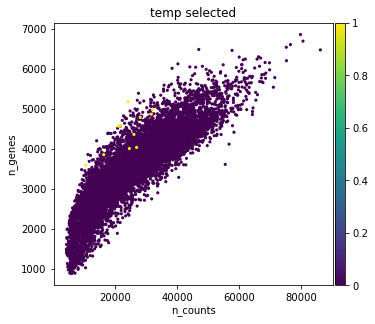

In [225]:
# recluster clusters that previously had less or more than 1 annotted cell type (exclusing NA and other).
for cluster in sorted(list(adata_rawnormalised.obs['cluster'].unique()),key=int):
    if len(cluster_annotation[cluster]) != 1 or len(
        [cell_type for cell_type in cluster_annotation[cluster] if cell_type !='NA' and cell_type !='other']) == 0:
        print('**** Original cluster',cluster)
        res=0.3
        adata_temp,assignment_df_temp=get_cluster_data(adata_original=adata_rawnormalised, cluster=cluster,
                                                       cluster_col='cluster',assignment_df=assignment_df)
        subcluster(adata_cluster=adata_temp,res=res,original_cluster=cluster,assignment_df_temp=assignment_df_temp)
        cluster_annotate(assignment_df=assignment_df_temp,
                         cluster_col='leiden_scaled_r'+str(res),
                         # Use more leanient condition as this is already subclustered - 
                        # otherwise data could be in some cases subclustered almost idefinitely
                         present_threshold=0.1,nomain_threshold=0.8,
                     save=True,cluster_annotation=cluster_annotation,adata_main= adata_rawnormalised)

#C: Different clustering resolutions were used and some of the clusters were subclustered, however this could not resolve some of the clusters that are comprised of multiple cell types.

In [226]:
# Correct entries in cluster_annotation dict - all clusters that do not have exactly one entry will be assigned 'NA'
# If cluster is to be removed add 'remove'

cluster_annotation['9_1']=['alpha_gamma']
cluster_annotation['10_4']=['endothelial']
#Add proliferative to cluster 12
cluster_annotation['12_0']=['beta_proliferative']

In [227]:
# Assign cell types for cluster 12_1 based on already present cell types
for cell in adata_rawnormalised.obs.query('cluster == "12_1"').index:
    cell_type=assignment_df.at[cell,'type_union']
    new_cluster='12_1_'+cell_type
    add_category(adata_rawnormalised.obs,[cell],col='cluster',category=new_cluster)
    cluster_annotation[new_cluster]=[cell_type+'_proliferative']

... storing 'leiden_scaled_r0.3' as categorical


**** Original cluster 10_2


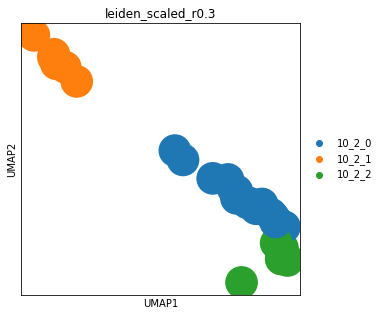


Cluster: 10_2_0 	size: 16
Present: ['beta', 'NA', 'ductal']
beta        0.4375
NA          0.3125
ductal      0.1250
pericyte    0.0625
alpha       0.0625
Name: type_union, dtype: float64


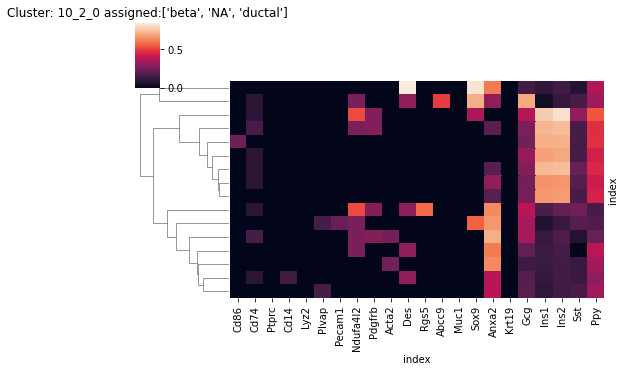

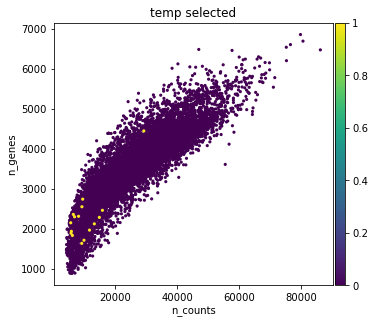


Cluster: 10_2_1 	size: 6
Present: ['ductal', 'ductal_alpha']
ductal          0.666667
ductal_alpha    0.333333
Name: type_union, dtype: float64


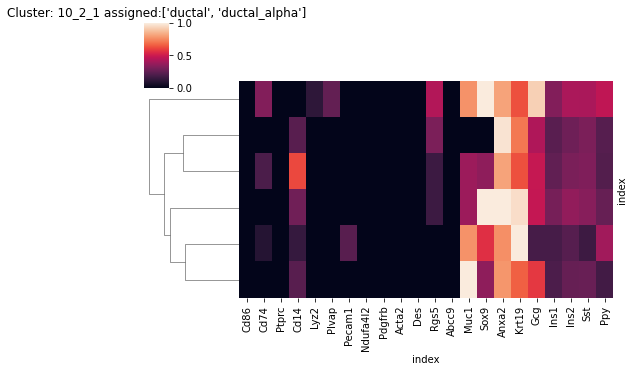

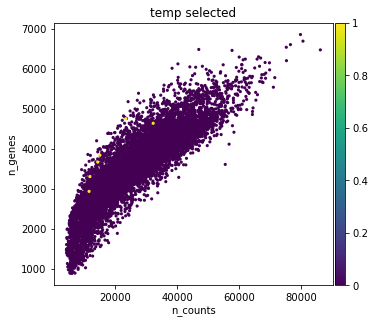


Cluster: 10_2_2 	size: 6
Present: ['pericyte', 'pericyte_beta']
pericyte         0.833333
pericyte_beta    0.166667
Name: type_union, dtype: float64


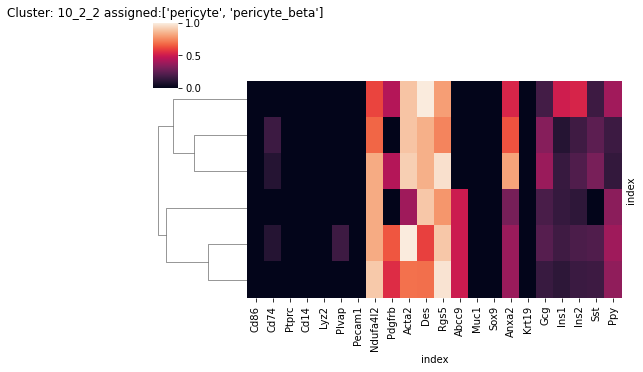

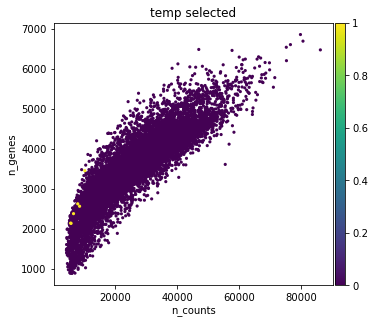

... storing 'leiden_scaled_r0.3' as categorical


**** Original cluster 7_1


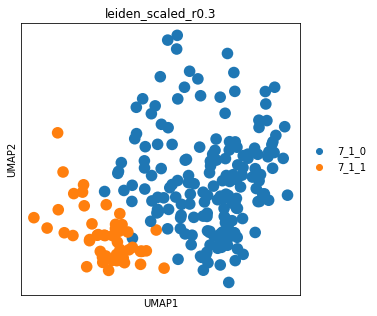


Cluster: 7_1_0 	size: 174
Present: ['delta']
delta          0.931034
beta_delta     0.034483
delta_gamma    0.022989
alpha_delta    0.005747
NA             0.005747
Name: type_union, dtype: float64

Cluster: 7_1_1 	size: 49
Present: ['delta_gamma', 'delta']
delta_gamma          0.632653
delta                0.142857
beta_delta_gamma     0.081633
alpha_delta_gamma    0.061224
beta_delta           0.020408
alpha_delta          0.020408
gamma                0.020408
NA                   0.020408
Name: type_union, dtype: float64


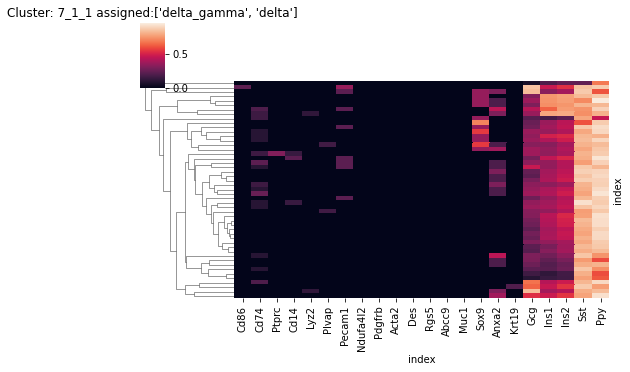

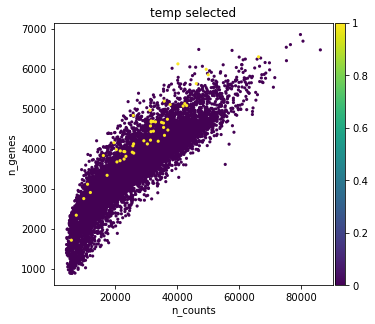

In [235]:
for cluster in sorted(list(adata_rawnormalised.obs['cluster'].unique())):
    if len(cluster_annotation[cluster]) != 1 or len(
        [cell_type for cell_type in cluster_annotation[cluster] if cell_type !='NA' and cell_type !='other']) == 0:
        print('**** Original cluster',cluster)
        res=0.3
        adata_temp,assignment_df_temp=get_cluster_data(adata_original=adata_rawnormalised, cluster=cluster,
                                                       cluster_col='cluster',assignment_df=assignment_df)
        subcluster(adata_cluster=adata_temp,res=res,original_cluster=cluster,assignment_df_temp=assignment_df_temp)
        cluster_annotate(assignment_df=assignment_df_temp,
                         cluster_col='leiden_scaled_r'+str(res),
                         # Use more leanient condition as this is already subclustered - 
                        # otherwise data could be in some cases subclustered almost idefinitely
                         present_threshold=0.1,nomain_threshold=0.8,
                     save=True,cluster_annotation=cluster_annotation,adata_main= adata_rawnormalised)

#C: Ins genes are highly ambient so if they were present to a small extent in another cluster they were not always treated as a separate subpopulation. 

In [236]:
#Manually annotate
cluster_annotation['10_2_0']=['NA']
cluster_annotation['10_2_1']=['ductal']
cluster_annotation['10_2_2']=['pericyte']
cluster_annotation['7_1_1']=['delta_gamma']

#### Add cluster based annotation to adata

In [237]:
# Display cluster annotation of clusters that will be used
clusters=list(adata_rawnormalised.obs['cluster'].unique())
clusters.sort()
for cluster in clusters:
    print(cluster ,cluster_annotation[cluster ])

0 ['beta']
1 ['beta']
10_0 ['endothelial']
10_1 ['endothelial']
10_2_0 ['NA']
10_2_1 ['ductal']
10_2_2 ['pericyte']
10_3 ['endothelial_pericyte']
10_4 ['endothelial']
11 ['immune']
12_0 ['beta_proliferative']
12_1_alpha ['alpha_proliferative']
12_1_alpha_delta ['alpha_delta_proliferative']
12_1_delta ['delta_proliferative']
12_1_ductal ['ductal_proliferative']
2 ['beta']
3 ['beta']
4 ['alpha']
5 ['beta']
6 ['beta']
7_0 ['delta']
7_1_0 ['delta']
7_1_1 ['delta_gamma']
7_2 ['delta']
7_3 ['beta_delta']
7_4 ['alpha_delta']
8 ['beta']
9_0 ['gamma']
9_1 ['alpha_gamma']
9_2 ['gamma']


In [238]:
# Add cell type annotation to clusters. 
# If clusters was annotated with more than one cell type (inbcluding NA or other) set it to 'NA'.
if 'cell_type' in adata_rawnormalised.obs.columns:
    adata_rawnormalised.obs.drop('cell_type',axis=1,inplace=True)
for row_idx in adata_rawnormalised.obs.index:
    cluster=adata_rawnormalised.obs.at[row_idx,'cluster']
    cell_type=cluster_annotation[cluster]
    if len(cell_type)!=1:
        cell_type='NA'
    else:
        cell_type=cell_type[0]
        
    add_category(df=adata_rawnormalised.obs,idxs=row_idx,col='cell_type',category=cell_type)

### Cell type annotation evaluation

In [239]:
# Add cell type to adata
adata.obs['cell_type']=adata_rawnormalised.obs.cell_type
# Add final clusters and starting clusters to adata
adata.obs[['cluster',clusters_col]]=adata_rawnormalised.obs[['cluster',clusters_col]]
# Add cell type scores
score_cols=[col for col in scores_df_norm.columns if '_score' in col]
adata.obs[score_cols]=scores_df_norm[score_cols].reindex(adata.obs.index)

... storing 'cell_type' as categorical


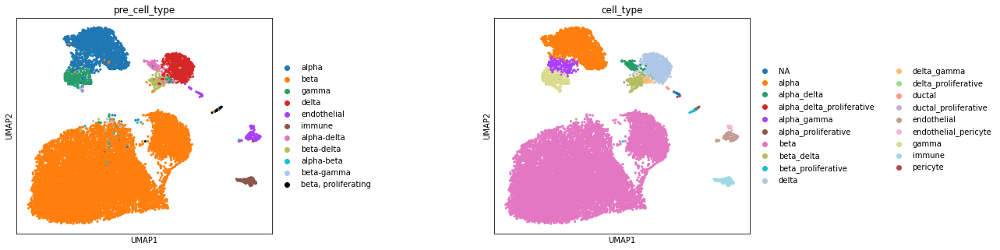

In [240]:
# Plot cell types on UMPA (pre-annotated and new ones)
sc.pl.umap(adata_rawnormalised, color=['pre_cell_type','cell_type'], size=40, use_raw=False,wspace=0.7)

In [241]:
# Count of new cell types
adata_rawnormalised.obs.cell_type.value_counts()

beta                         13753
alpha                         1828
delta                          661
gamma                          350
alpha_gamma                    177
beta_delta                     145
immune                         110
endothelial                     99
alpha_delta                     98
delta_gamma                     49
beta_proliferative              24
endothelial_pericyte            20
NA                              16
alpha_proliferative              8
ductal                           6
pericyte                         6
delta_proliferative              1
alpha_delta_proliferative        1
ductal_proliferative             1
Name: cell_type, dtype: int64

Text(0.5, 1.0, 'cell_type')

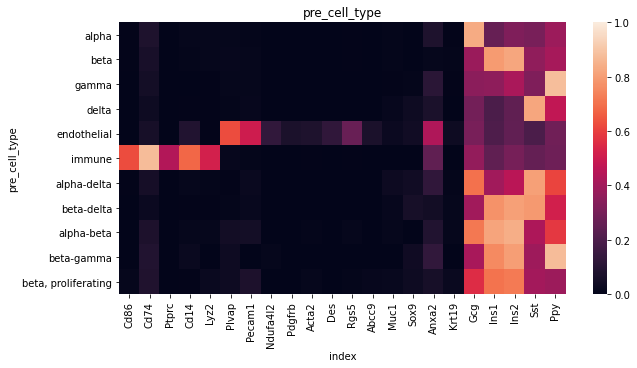

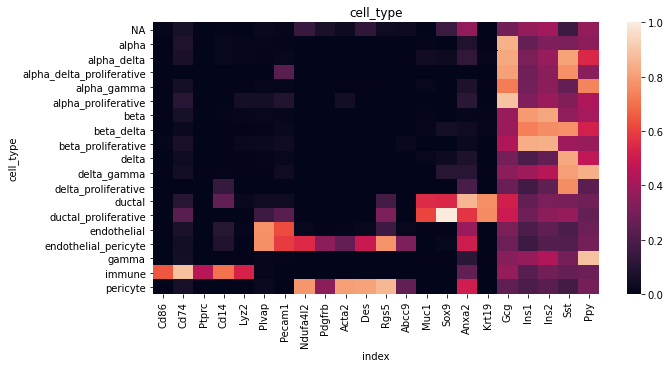

In [249]:
# Plot mean marker expression in each cluster
rcParams['figure.figsize']=(10,5)
fig,ax=plt.subplots()
sb.heatmap(scaled_expression.groupby(adata_rawnormalised.obs['pre_cell_type']).mean(),yticklabels=1,xticklabels=1,
           vmin=0,vmax=1)
ax.set_title('pre_cell_type')
fig,ax=plt.subplots()
sb.heatmap(scaled_expression.groupby(adata_rawnormalised.obs['cell_type']).mean(),yticklabels=1,xticklabels=1,
           vmin=0,vmax=1)
ax.set_title('cell_type')

QC metrics in each cell type.

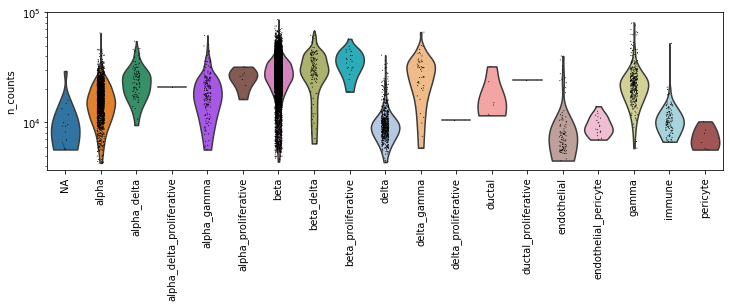

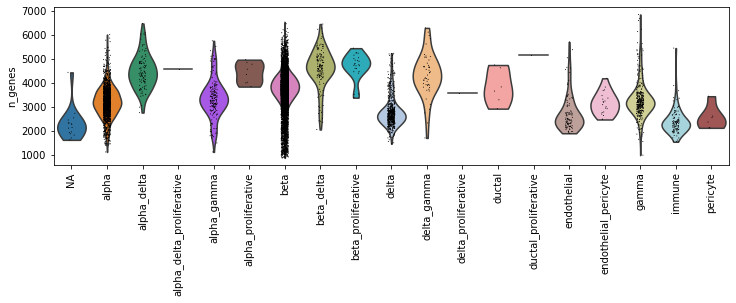

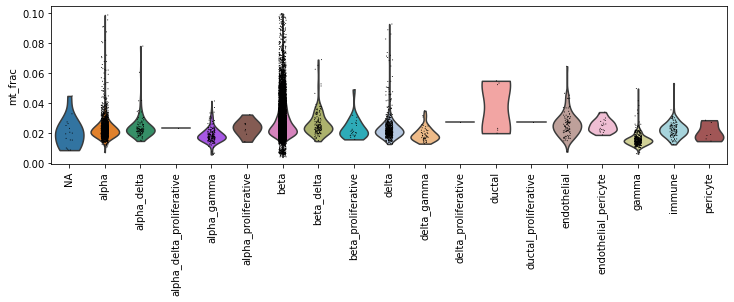

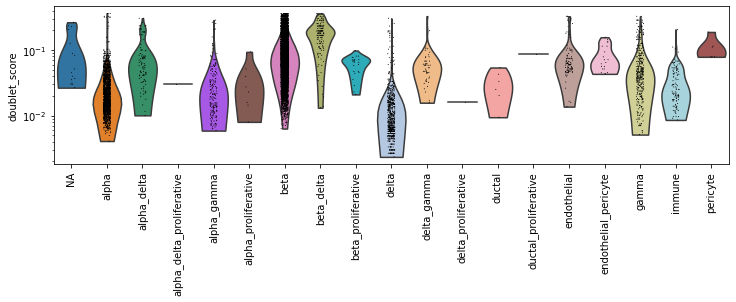

In [244]:
# QC metrics per cell type
rcParams['figure.figsize']=(10,3)
sc.pl.violin(adata, ['n_counts'], groupby='cell_type', size=1, log=True,rotation=90)
sc.pl.violin(adata, ['n_genes'], groupby='cell_type', size=1, log=False,rotation=90)
sc.pl.violin(adata, ['mt_frac'], groupby='cell_type', size=1, log=False,rotation=90)
sc.pl.violin(adata, 'doublet_score',groupby='cell_type',size=1, log=True,rotation=90)

#C: Based on QC metrics (N genes, doublet scores) some mixed cell types might be doublets.

#### Cell type markers

Upregulated genes in each cell type compared to other cells on normalised log scaled data.

In [246]:
# Compute overexpressed genes in each cell type on normalised log scaled data
#Retain only cell types with >=10 cells and non-NA annotation
groups_counts=adata.obs.cell_type.value_counts()
groups=[cell_type for cell_type in groups_counts[groups_counts>=10].index if cell_type!='NA']
# Compute markers
sc.tl.rank_genes_groups(adata,groupby='cell_type',groups=groups, use_raw=False)
sc.tl.filter_rank_genes_groups(adata,groupby='cell_type', use_raw=False)

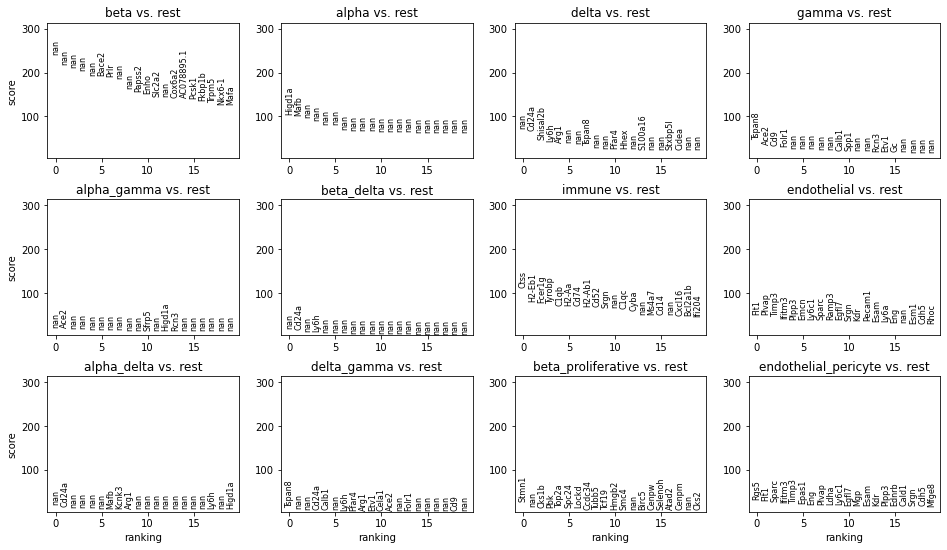

In [247]:
# Plot cell_type vs rest upregulated genes
rcParams['figure.figsize']=(4,3)
sc.pl.rank_genes_groups(adata,key='rank_genes_groups_filtered')

Expression of upregulated genes on normalised log transformed z-scaled data

categories: NA, alpha, alpha_delta, etc.
var_group_labels: beta, alpha, delta, etc.


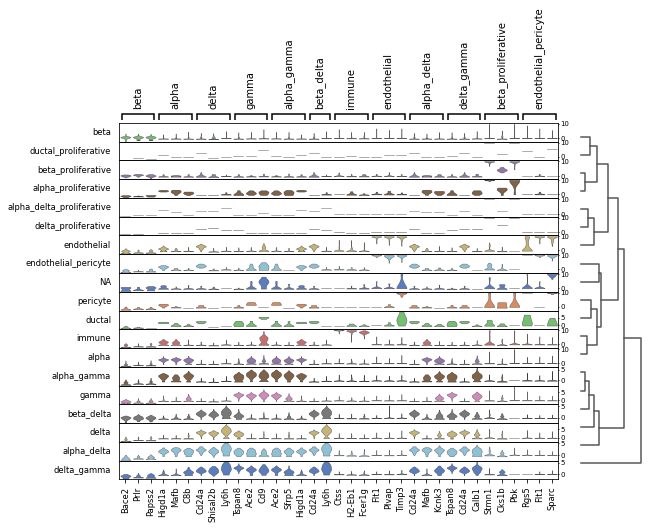

In [248]:
# Plot expression of cell type upregulated genes on normalised log transformed z-scaled data
adata_scl.uns['rank_genes_groups_filtered']=adata.uns['rank_genes_groups_filtered']
adata_scl.obs['cell_type']=adata.obs['cell_type']
sc.pl.rank_genes_groups_stacked_violin(adata_scl,key='rank_genes_groups_filtered',n_genes=3,use_raw=False)

#C: It latter needs to be evaluated if mixed cell type populations present doublets or true cell types.

### Expected doublet rates

Adapted from https://www.ncbi.nlm.nih.gov/pmc/articles/PMC6126471/#ref-7, but using 0.1 as doublet rate (described in my notes).

Expected multiplet number is calculated for each file separately.

In [13]:
# Singlet cell types whose multiplet rates are predicted
cell_types=['alpha','beta','gamma','delta']
# DFs with expected multiplet rates
expected_dfs=[]
# Calculate expected rate for each file separately
for file in adata.obs.file.unique():
    print('\nFile:',file)
    # Exclude some endocrine cells as they form completely separate populations 
    # with no multiplets in neighbourhood)
    exclude_types=['beta_proliferative','alpha_delta_proliferative','delta_proliferative','alpha_proliferative']
    cell_type_temp=adata.obs.query('file == "'+file+'" & cell_type not in @exclude_types').cell_type.copy()
    
    # N of droplets containing at least one cell of the relevant cell type
    Ns=dict()
    for cell_type in cell_types:
        n_celltype=cell_type_temp.str.contains(cell_type).sum()
        Ns[cell_type]=n_celltype
    print('N droplets that contain at least one:',Ns)
    
    # Calculate N (see formula in notes)
    N=emr.get_N(Ns=Ns.values())
    regex_any='|'.join(['.*'+cell_type+'.*' for cell_type in cell_types])
    print('N:',round(N,1), '(observed cell-containing N with relevant cell types:',
          cell_type_temp.str.contains(fr'{regex_any}').sum(),')')
    
    # Calculate mu for each cell type
    mus=dict()
    for cell_type in cell_types:
        mus[cell_type]=emr.mu_cell_type(N_cell_type=Ns[cell_type], N=N)
    print('mu:',{k:round(v,4) for k,v in mus.items()})
    
    # Extract multiplet types and their components
    multiplet_types=dict()
    for cell_type in cell_type_temp.unique():
        # Get components of multiplets by retaining name parts contained in original cell type dict
        components_all=cell_type.split('_')
        components_relevant=[type_singlet for type_singlet in components_all if type_singlet in cell_types]
        if len(components_relevant) > 1:
            multiplet_types[cell_type]=components_relevant
            # This does not assure that initially the cell types are not counted wrongly 
            # (e.g. including proliferative, ...)
            #if len(components_relevant) < len(components_all):
            #    warnings.warn('Multiplet type has additional unrecognised component: '+cell_type)
    #print('Relevant multiplet cell types:',multiplet_types.keys())
    
    # This also analyses O and E of singlet types, but this is not so relevant as changes in multiplets also 
    # affect it?
    #types_OE= dict(zip(cell_types,[[i] for i in cell_types]))
    #types_OE.update(multiplet_types)
    
    # Calculate O (observed) and E (expected) numbers
    expected_df=pd.DataFrame(index=multiplet_types.keys(),columns=['O_'+file,'E_'+file
                                                                  # ,'E_atleast'
                                                                  ])
    #for multiplet, components in types_OE.items():
    for multiplet, components in multiplet_types.items():
        absent=np.setdiff1d(cell_types,components)
        # N of cellls of this cell type
        expected_df.at[multiplet,'O_'+file]=(cell_type_temp==multiplet).sum()
        # Expected N of cells that have all the individual cell types of multiplet and non of the other 
        # considered possible multiplet ontributors
        expected_df.at[multiplet,'E_'+file]=emr.expected_multiplet(
            mu_present=[mus[cell_type] for cell_type in components], 
            mu_absent=[mus[cell_type] for cell_type in absent], 
            N=N)
        # E that droplet contains at least one cell of each present cell type,
        # but does not exclude other cell types from being present
        #expected_df.at[multiplet,'E_atleast']=emr.expected_multiplet(
        #    mu_present=[mus[cell_type] for cell_type in components], 
        #    mu_absent=[], 
        #    N=N)
    expected_dfs.append(expected_df)
    
# Merge O/E rates for all files into single DF
display(pd.concat(expected_dfs,axis=1))
del cell_type_temp


File: mouse1
N droplets that contain at least one: {'alpha': 328, 'beta': 3276, 'gamma': 415, 'delta': 158}
N: 9316.5 (observed cell-containing N with relevant cell types: 3976 )
mu: {'alpha': 0.0358, 'beta': 0.4333, 'gamma': 0.0456, 'delta': 0.0171}

File: mouse2
N droplets that contain at least one: {'alpha': 115, 'beta': 4308, 'gamma': 156, 'delta': 184}
N: 11111.0 (observed cell-containing N with relevant cell types: 4660 )
mu: {'alpha': 0.0104, 'beta': 0.4906, 'gamma': 0.0141, 'delta': 0.0167}

File: mouse4
N droplets that contain at least one: {'alpha': 678, 'beta': 4388, 'gamma': 2, 'delta': 391}
N: 12272.9 (observed cell-containing N with relevant cell types: 5335 )
mu: {'alpha': 0.0568, 'beta': 0.4424, 'gamma': 0.0002, 'delta': 0.0324}

File: mouse3
N droplets that contain at least one: {'alpha': 982, 'beta': 1926, 'gamma': 3, 'delta': 220}
N: 6693.8 (observed cell-containing N with relevant cell types: 3090 )
mu: {'alpha': 0.1586, 'beta': 0.3393, 'gamma': 0.0004, 'delta': 0.

,O_mouse1,E_mouse1,O_mouse2,E_mouse2,O_mouse4,E_mouse4,O_mouse3,E_mouse3
alpha_gamma,155,9.31237,18,0.972218,1,0.0687227,3,0.303174
alpha_delta,9,3.44594,10,1.14966,52,13.8751,27,22.978
delta_gamma,24,4.40257,25,1.56537,NaN,NaN,NaN,NaN
beta_delta,13,51.2144,50,69.6112,71,132.052,11,53.9899


In [14]:
# Reassign cell types to multiplet
multiplets=['beta_delta']
adata.obs['cell_type_multiplet']=adata.obs.cell_type.replace(multiplets, 'multiplet')

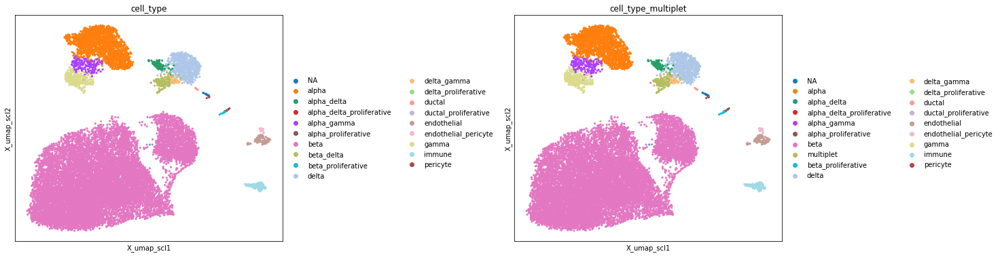

In [15]:
# Plot new cell types
rcParams['figure.figsize']=(6,6)
sc.pl.embedding(adata,'X_umap_scl', color=['cell_type','cell_type_multiplet'], size=40, use_raw=False,wspace=0.7)

## Resolve beta subtypes

#### Preprocess beta cell data

Select beta cells only

In [6]:
[ct for ct in adata.obs.cell_type_multiplet.unique() if 'beta' in ct]

['beta', 'beta_proliferative']

#C: No beta str containing cell types to exclude

In [7]:
# Subset adata
selected_beta=[ct for ct in adata.obs.cell_type_multiplet.unique() if 'beta' in ct]
adata_beta=adata[adata.obs.cell_type.isin(selected_beta),:].copy()
adata_beta.shape

# Normalise raw data for plotting and cell type scoring
adata_raw_beta=adata_beta.raw.to_adata().copy()
# Normalize and log transform
adata_raw_beta.X /= adata_raw_beta.obs['size_factors'].values[:,None] # This reshapes the size-factors array
sc.pp.log1p(adata_raw_beta)
adata_raw_beta.X = sparse.csr_matrix(np.asarray(adata_raw_beta.X))

# Scale beta adata for umap
adata_scl_beta=adata_beta
del adata_beta
sc.pp.scale(adata_scl_beta,max_value=10)
sc.pp.pca(adata_scl_beta, n_comps=10, use_highly_variable=True, svd_solver='arpack')
sc.pp.neighbors(adata_scl_beta,n_pcs=10)
sc.tl.umap(adata_scl_beta)

# Combine raw and X data
adata_rawnormalised_beta=adata_scl_beta.copy()
adata_rawnormalised_beta.raw=adata_raw_beta
del adata_raw_beta

/home/icb/karin.hrovatin/miniconda3/envs/rpy2_3/lib/python3.8/site-packages/scanpy/neighbors/__init__.py:121: FutureWarning: This location for 'distances' is deprecated. It has been moved to .obsp[distances], and will not be accesible here in a future version of anndata.
  adata.uns['neighbors']['distances'] = neighbors.distances
/home/icb/karin.hrovatin/miniconda3/envs/rpy2_3/lib/python3.8/site-packages/scanpy/neighbors/__init__.py:122: FutureWarning: This location for 'connectivities' is deprecated. It has been moved to .obsp[connectivities], and will not be accesible here in a future version of anndata.
  adata.uns['neighbors']['connectivities'] = neighbors.connectivities
/home/icb/karin.hrovatin/miniconda3/envs/rpy2_3/lib/python3.8/site-packages/scanpy/tools/_umap.py:147: FutureWarning: This location for 'connectivities' is deprecated. It has been moved to .obsp[connectivities], and will not be accesible here in a future version of anndata.
  adata.uns['neighbors']['connectivities'

In [8]:
metadata=pd.read_excel('/lustre/groups/ml01/workspace/karin.hrovatin/data/pancreas/scRNA/scRNA-seq_pancreas_metadata.xlsx',
                      sheet_name='Fltp_adult')
# Add metadata 
samples=adata_rawnormalised_beta.obs.file.unique()
value_map={sample:metadata.query('sample_name =="'+sample+'"')['design'].values[0] for sample in samples}
adata_rawnormalised_beta.obs['design']=adata_rawnormalised_beta.obs.file.map(value_map)

Trying to set attribute `.uns` of view, copying.


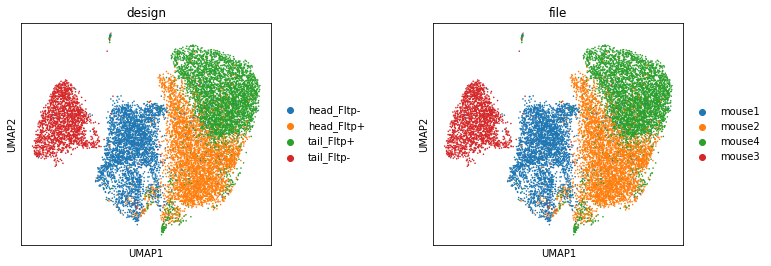

In [10]:
rcParams['figure.figsize']=(4,4)
random_indices=np.random.permutation(list(range(adata_rawnormalised_beta.shape[0])))
sc.pl.umap(adata_rawnormalised_beta[random_indices,:], color=['design','file'],size=10, use_raw=True,wspace=0.5)

#### Check markers

('beta', '/')
Missing genes: []


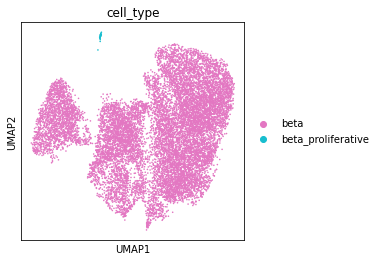

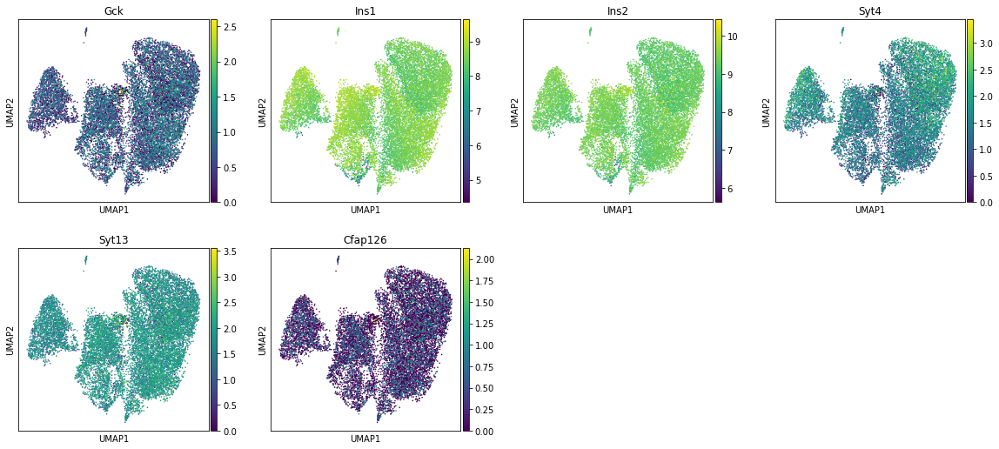

('beta', 'aging')
Missing genes: []


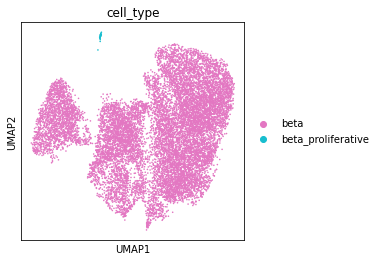

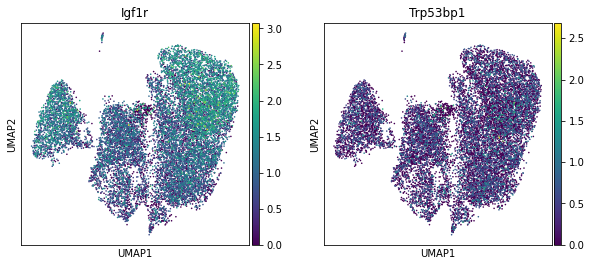

('beta', 'dedifferentiated')
Missing genes: []


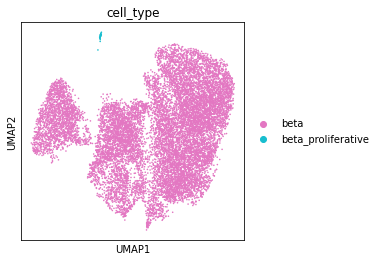

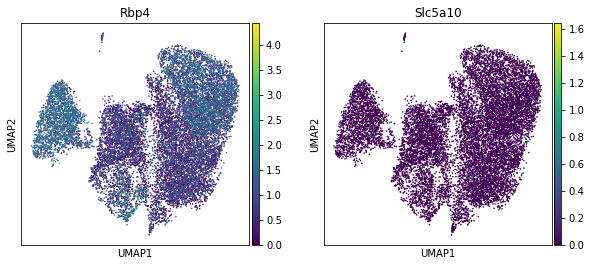

('beta', 'disease')
Missing genes: []


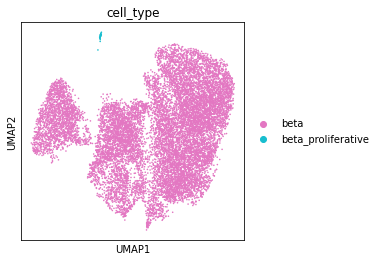

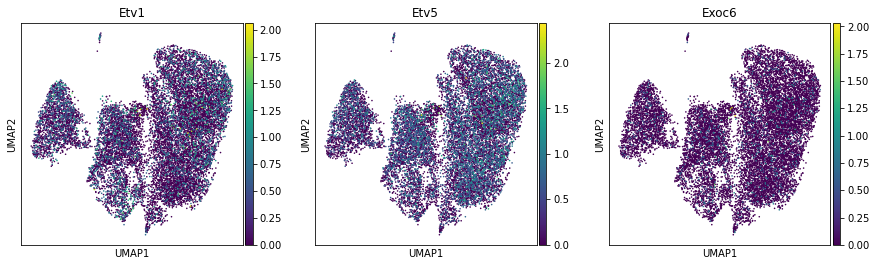

('beta', 'immature')
Missing genes: ['Pax4']


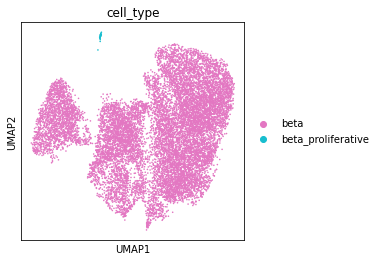

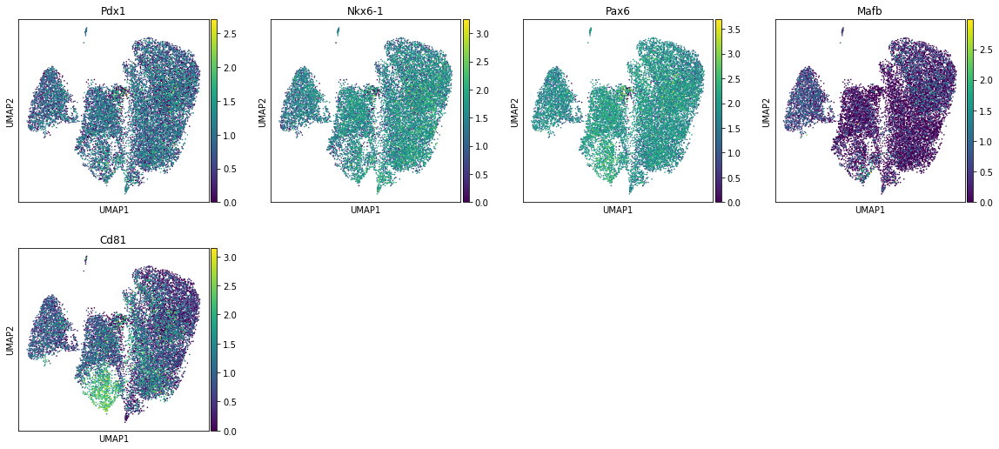

('beta', 'inflamation')
Missing genes: []


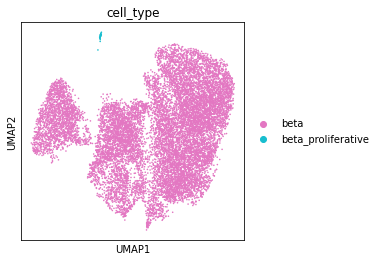

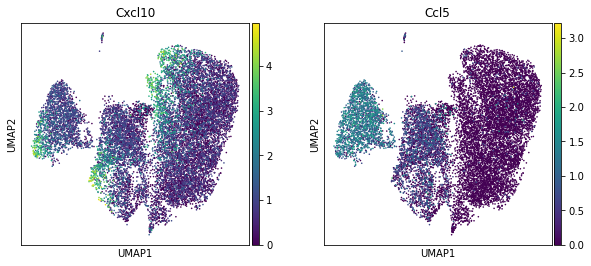

('beta', 'mature')
Missing genes: []


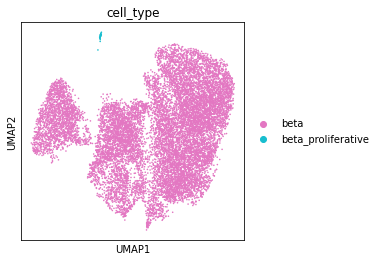

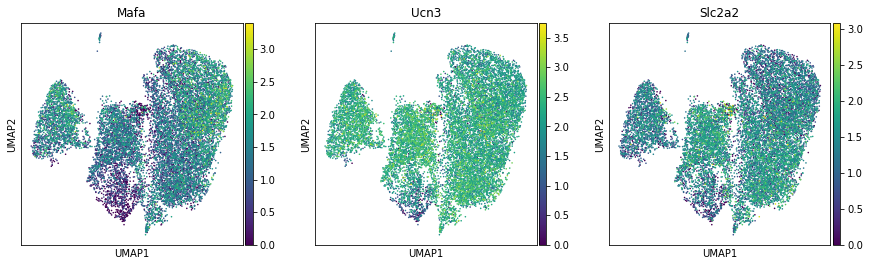

('beta', 'senescent')
Missing genes: []


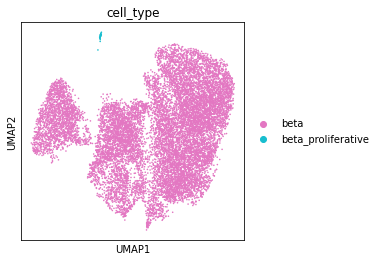

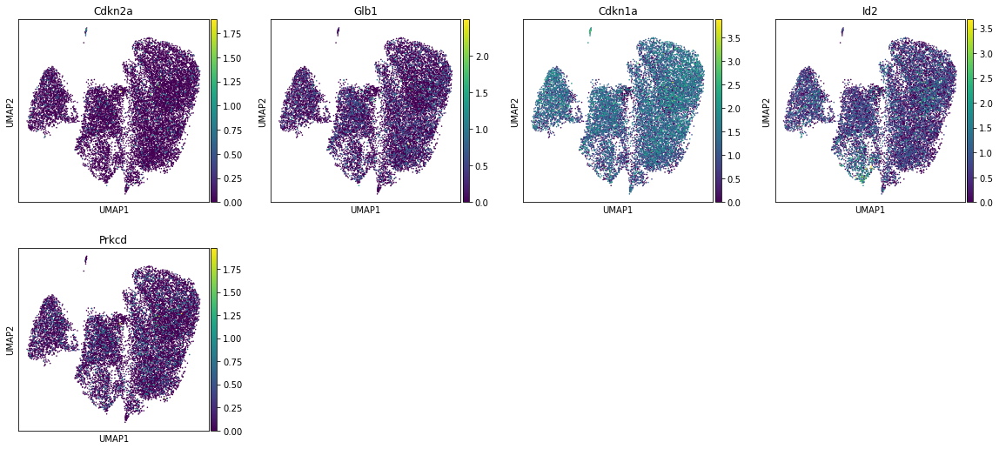

('endocrine', '/')
Missing genes: ['Neurod2']


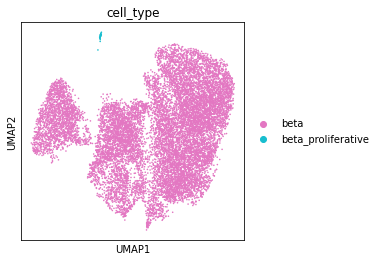

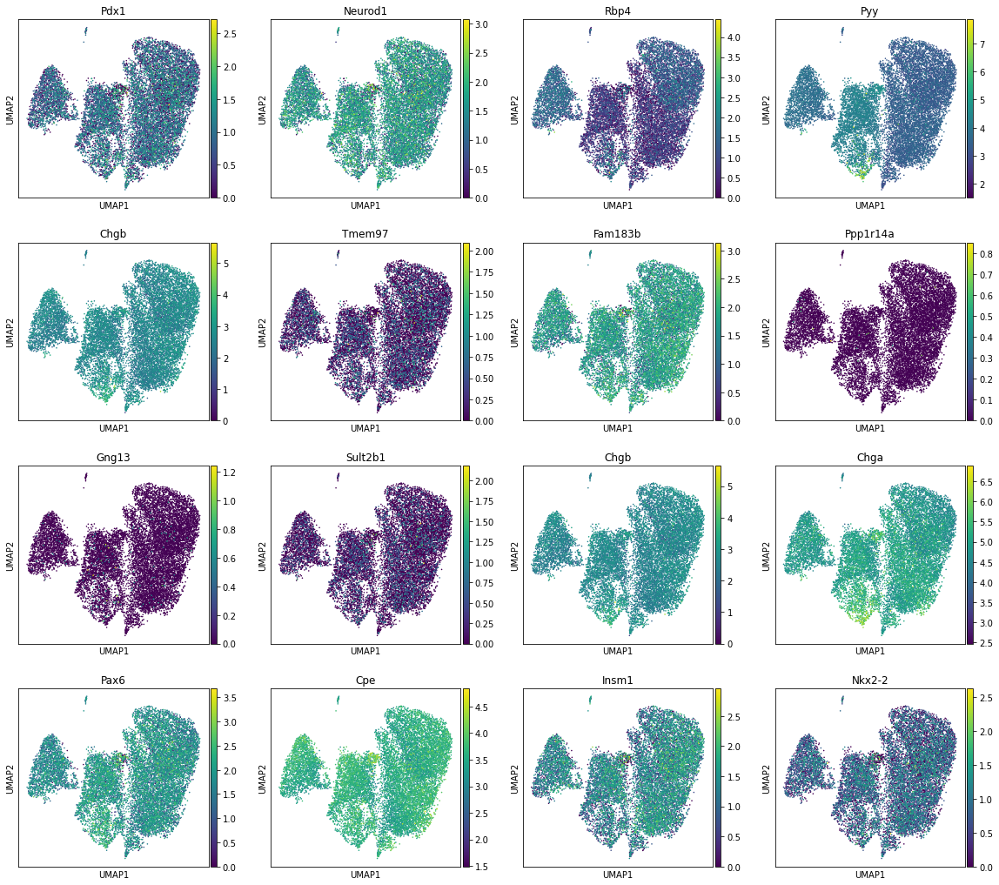

In [57]:
# Select beta and endocrine markers and group by cell type and subtype
for group_name, group in markers.query('Cell in ["beta","endocrine"]').fillna('/').groupby(['Cell','Subtype']):
    print(group_name)
    genes=group.Gene
    # Retain genes present in raw var_names
    missing=[gene for gene in genes if gene not in adata.raw.var_names]
    genes=[gene for gene in genes if gene in adata.raw.var_names]
    print('Missing genes:',missing)
    rcParams['figure.figsize']=(4,4)
    sc.pl.umap(adata_rawnormalised_beta, color=['cell_type'],size=10, use_raw=True)
    sc.pl.umap(adata_rawnormalised_beta, color=genes ,size=10, use_raw=True)

#C: ins low corresponds to Syt4/13 and Gck low. Only ins will be used for annotation of ins low (as was done elsewhere). Similar pattern is also followed by Igfr1, which is aging gene - possibly ins low here are immature. Rbp4 (dediff) is mostly lower than in other studies and has different pattern than Cd81 - which is expressed more strongly and may thus better indicate immature cells. Cxcl10 has obvious pattern. One sample has high Ccl5 and a slightly elevated Rbp4 (some samples have slightly elevated only one of them). Maturity markers indicate that some Rbp4 slightly elevated populations are probably not immature. Distinguish between immature (Mafb, Pyy) and Cd81 high.

#C: proliferative beta cells will not be used further.

In [8]:
adata_rawnormalised_beta=adata_rawnormalised_beta[adata_rawnormalised_beta.obs.cell_type!='beta_proliferative',:]

In [9]:
# Selected markers that seem to be able to distinguish between cell seubtypes
markers_selection_beta={
'immature':['Mafb','Pyy'],
'Cd81_high':['Cd81'],   
'mature':['Mafa', 'Ucn3','Slc2a2'],
'ins_high':['Ins1','Ins2'],
'Cxcl10_high':['Cxcl10'],
'Ccl5_high':['Ccl5']
}

#### Calculate subpopulation scores

In [10]:
# Calculate scores
scores=[]
for cell_type,genes in markers_selection_beta.items():
    score_name=cell_type+'_score'
    scores.append(cell_type+'_score')
    sc.tl.score_genes(adata_rawnormalised_beta, gene_list=genes, score_name=score_name,  use_raw=True)

Trying to set attribute `.obs` of view, copying.


In [11]:
# Scores normalised to interval [0,1] for each cell type - so that they can be more easily compared
scores_df_norm_beta=adata_rawnormalised_beta.obs[scores]
scores_df_norm_beta=pd.DataFrame(pp.minmax_scale(scores_df_norm_beta),columns=scores_df_norm_beta.columns,index=adata_rawnormalised_beta.obs.index)

#### Score distn and relationships

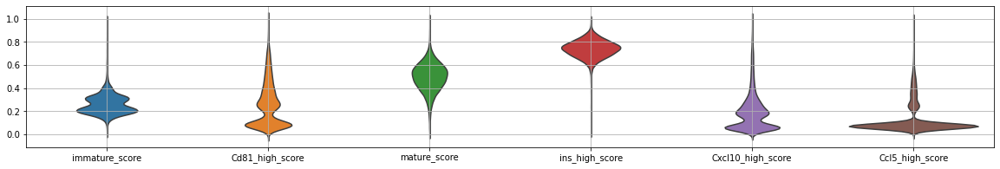

In [12]:
# Plot of normalised scores distribution in whole dataset, per cluster
rcParams['figure.figsize']=(20,3)
fig,ax=plt.subplots()
sb.violinplot(data=scores_df_norm_beta,inner=None,ax=ax)
ax.grid()

In [13]:
# Convert ins high to ins low
scores_df_norm_beta['ins_low_score']=scores_df_norm_beta['ins_high_score']*-1+1

In [14]:
# Dict for score thresholds
beta_marker_thresholds=dict()

Text(0, 0.5, 'mature_score')

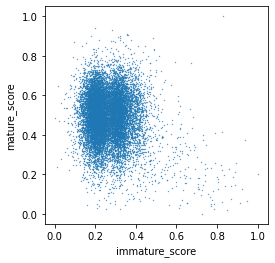

In [15]:
# Find immature
rcParams['figure.figsize']=(4,4)
plt.scatter(scores_df_norm_beta['immature_score'],scores_df_norm_beta['mature_score'],s=0.1)
plt.xlabel('immature_score')
plt.ylabel('mature_score')

Dist of differences between mature and immature

In [16]:
scores_df_norm_beta['immature-mature_score']=scores_df_norm_beta['immature_score']-scores_df_norm_beta['mature_score']

Text(0.5, 0, 'immature-mature score')

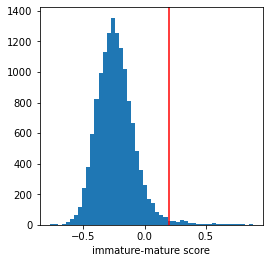

In [17]:
a=plt.hist(scores_df_norm_beta['immature-mature_score'],bins=50)
beta_marker_thresholds['immature-mature_score']=0.2
plt.axvline(beta_marker_thresholds['immature-mature_score'],c='r')
plt.xlabel('immature-mature score')

Text(0, 0.5, 'mature_score')

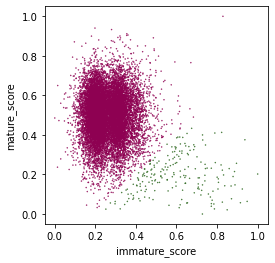

In [18]:
plt.scatter(scores_df_norm_beta['immature_score'],scores_df_norm_beta['mature_score'],s=0.2,
            c=scores_df_norm_beta['immature-mature_score']>=beta_marker_thresholds['immature-mature_score'],
            cmap='PiYG')
plt.xlabel('immature_score')
plt.ylabel('mature_score')

Text(0, 0.5, 'Cd81_high_score')

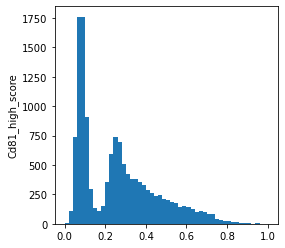

In [19]:
a=plt.hist(scores_df_norm_beta['Cd81_high_score'],bins=50)
plt.ylabel('Cd81_high_score')

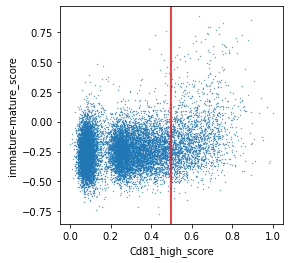

In [20]:
plt.scatter(scores_df_norm_beta['Cd81_high_score'],scores_df_norm_beta['immature-mature_score'],s=0.1)
plt.xlabel('Cd81_high_score')
plt.ylabel('immature-mature_score')
beta_marker_thresholds['Cd81_high_score']=0.5
plt.axvline(beta_marker_thresholds['Cd81_high_score'],c='r')

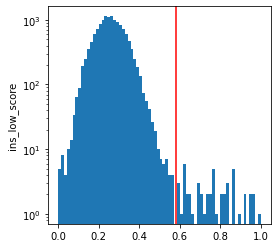

In [21]:
a=plt.hist(scores_df_norm_beta['ins_low_score'],bins=70)
plt.yscale('log')
plt.ylabel('ins_low_score')
beta_marker_thresholds['ins_low_score']=0.58
plt.axvline(beta_marker_thresholds['ins_low_score'],c='r')

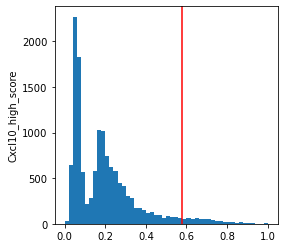

In [22]:
a=plt.hist(scores_df_norm_beta['Cxcl10_high_score'],bins=50)
#plt.yscale('log')
plt.ylabel('Cxcl10_high_score')
beta_marker_thresholds['Cxcl10_high_score']=0.58
plt.axvline(beta_marker_thresholds['Cxcl10_high_score'],c='r')

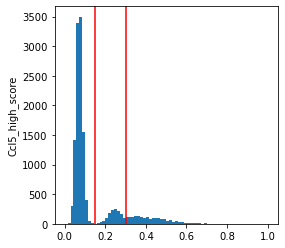

In [23]:
# Separate in Ccl5 high and very_high
a=plt.hist(scores_df_norm_beta['Ccl5_high_score'],bins=70)
#plt.yscale('log')
plt.ylabel('Ccl5_high_score')
beta_marker_thresholds['Ccl5_high_score']=0.15
beta_marker_thresholds['Ccl5_very_high_score']=0.3
plt.axvline(beta_marker_thresholds['Ccl5_high_score'],c='r')
plt.axvline(beta_marker_thresholds['Ccl5_very_high_score'],c='r')

In [161]:
# Add Ccl5 high to special obs column
#ccl5=pd.Series(index=scores_df_norm_beta.index)
#ccl5[scores_df_norm_beta['Ccl5_high_score']>=beta_marker_thresholds['Ccl5_high_score']]='high'
#ccl5[scores_df_norm_beta['Ccl5_high_score']>=beta_marker_thresholds['Ccl5_very_high_score']]='very_high'
#ccl5.fillna('low',inplace=True)
#adata.obs.loc[adata_rawnormalised_beta.obs.index,'Ccl5']=ccl5

<ipython-input-161-861b8383c86b>:2: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  ccl5=pd.Series(index=scores_df_norm_beta.index)


In [24]:
# Thresholds for cell type assignemnt based on normalised scores
scores_cols_beta=['immature-mature_score','Cd81_high_score','ins_low_score','Cxcl10_high_score','Ccl5_high_score']
thresholds_beta=[beta_marker_thresholds[score_col] for score_col in scores_cols_beta]

In [25]:
# Assign cell types based on scores to each cell
assignment_df_beta=scores_df_norm_beta[scores_cols_beta]>=thresholds_beta
# replace '-mature' from immature-mature to get just immature out for the cell type name
assignment_df_beta.columns=[col.replace('_score','').replace('-mature','') for col in scores_cols_beta] 

In [26]:
# For each cell make a (standard) string of annotated cell types: 
# e.g. each annotated cell type in the same order, separated by '_' when multiple cell types were annotated
type_unions_beta=[]
for idx,row in assignment_df_beta.iterrows():
    type_union=''
    for col in row.index:
        # Remove Ccl5 from union of cell types
        if row[col]:
            type_union=type_union+col+'_'
    if type_union=='':
        type_union='NA'
    type_unions_beta.append(type_union.rstrip('_'))

In [27]:
# Add cell types strings of cells to scores/assignment DF
assignment_df_beta['type_union']=type_unions_beta
assignment_df_beta['type_union'].value_counts()

NA                                                  8845
Ccl5_high                                           2572
Cd81_high                                           1210
Cxcl10_high                                          344
Cd81_high_Ccl5_high                                  320
Cxcl10_high_Ccl5_high                                153
immature_Cd81_high                                    84
Cd81_high_Cxcl10_high                                 70
immature                                              27
immature_Cd81_high_Ccl5_high                          27
immature_Cd81_high_ins_low                            25
Cd81_high_Cxcl10_high_Ccl5_high                       24
immature_Ccl5_high                                    13
Cd81_high_ins_low                                      9
ins_low                                                6
immature_Cd81_high_Cxcl10_high                         6
immature_ins_low                                       6
immature_Cxcl10_high_Ccl5_high 

In [28]:
adata_rawnormalised_beta.obs['beta_subtype']=assignment_df_beta['type_union']

... storing 'beta_subtype' as categorical


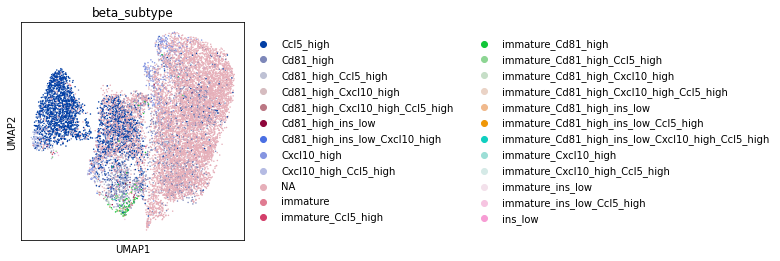

In [29]:
rcParams['figure.figsize']=(4,4)
sc.pl.umap(adata_rawnormalised_beta,color='beta_subtype')

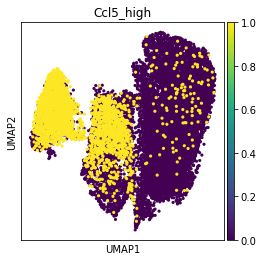

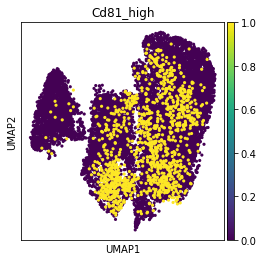

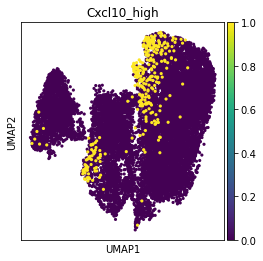

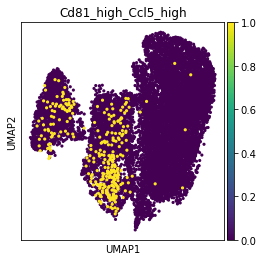

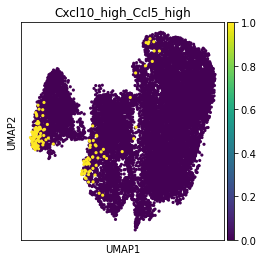

...

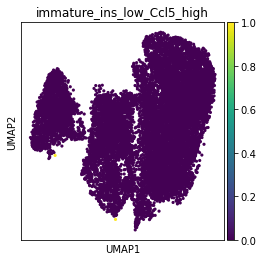

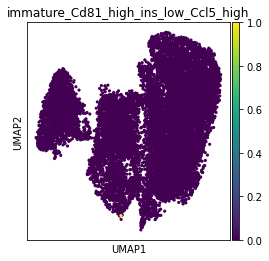

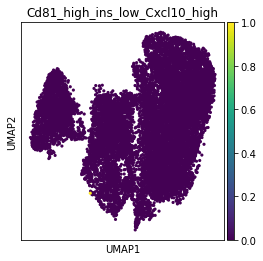

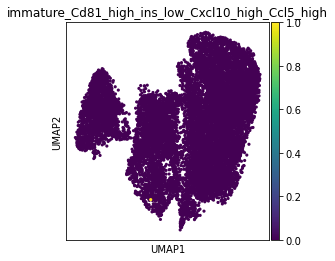

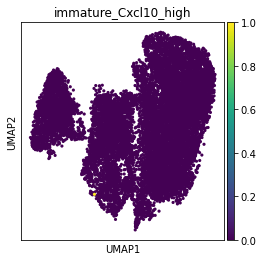

In [30]:
for subtype in adata_rawnormalised_beta.obs['beta_subtype'].value_counts().index:
    if subtype !='NA':
        adata_rawnormalised_beta.obs['temp']=adata_rawnormalised_beta.obs['beta_subtype']==subtype
        sc.pl.umap(adata_rawnormalised_beta,color='temp',size=40,title=subtype)
adata_rawnormalised_beta.obs.drop('temp',axis=1,inplace=True)

#C: Set less common cell types to more common ones based on UMAP position. If none of the individual cell types is common or the population is based on single cell type with low count set it to NA which will be interpreted as beta.

In [34]:
# rename cell types
adata_rawnormalised_beta.obs['beta_subtype'].replace({
            'immature_Cd81_high':'immature',
            'immature_Cd81_high_Ccl5_high':'immature_Ccl5_high',
            'immature_Cxcl10_high':'Cxcl10_high',
            'immature_Cxcl10_high_Ccl5_high':'Cxcl10_high_Ccl5_high',
            'ins_low':'NA',
            'immature_Cd81_high_ins_low':'immature_ins_low',
            'immature_Cd81_high_ins_low_Ccl5_high':'immature_ins_low',
            'immature_ins_low_Ccl5_high':'immature_ins_low',
            'immature_Cd81_high_Cxcl10_high':'Cd81_high_Cxcl10_high',
            'immature_Cd81_high_Cxcl10_high_Ccl5_high':'Cd81_high_Cxcl10_high_Ccl5_high',
            'Cd81_high_ins_low':'Cd81_high',
            'Cd81_high_ins_low_Cxcl10_high':'Cd81_high_Cxcl10_high',
            'immature_Cd81_high_ins_low_Cxcl10_high':'Cd81_high_Cxcl10_high',
            'immature_Cd81_high_ins_low_Cxcl10_high_Ccl5_high':'Cd81_high_Cxcl10_high_Ccl5_high'
                                                }, inplace=True)

In [35]:
adata_rawnormalised_beta.obs['beta_subtype'].value_counts()

NA                                 8851
Ccl5_high                          2572
Cd81_high                          1219
Cxcl10_high                         345
Cd81_high_Ccl5_high                 320
Cxcl10_high_Ccl5_high               156
immature                            111
Cd81_high_Cxcl10_high                77
immature_Ccl5_high                   40
immature_ins_low                     34
Cd81_high_Cxcl10_high_Ccl5_high      28
Name: beta_subtype, dtype: int64

... storing 'beta_subtype' as categorical


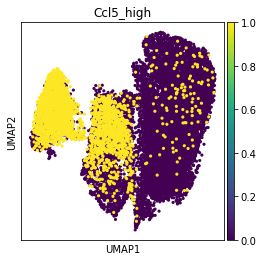

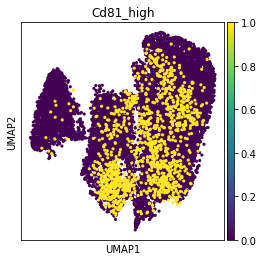

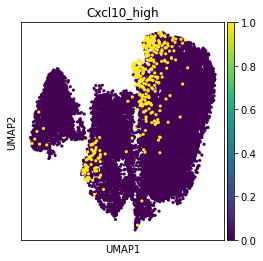

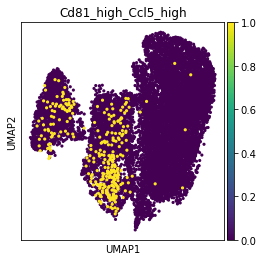

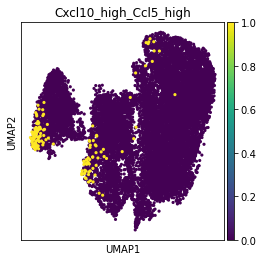

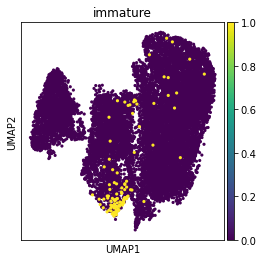

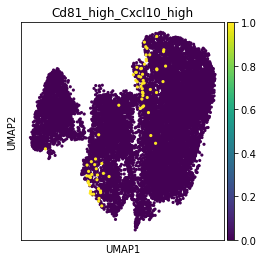

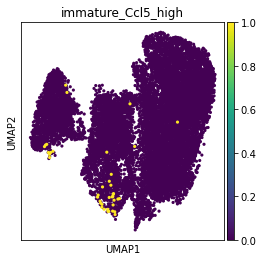

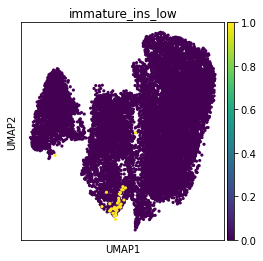

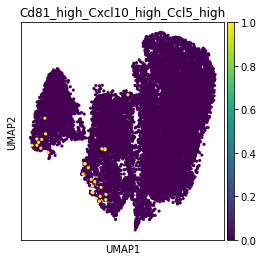

In [36]:
for subtype in adata_rawnormalised_beta.obs['beta_subtype'].value_counts().index:
    if subtype !='NA':
        adata_rawnormalised_beta.obs['temp']=adata_rawnormalised_beta.obs['beta_subtype']==subtype
        sc.pl.umap(adata_rawnormalised_beta,color='temp',size=40,title=subtype)
adata_rawnormalised_beta.obs.drop('temp',axis=1,inplace=True)

In [37]:
# Add cell type data to adata
adata.obs[['cell_subtype','cell_subtype_multiplet']]=adata.obs[['cell_type','cell_type_multiplet']]
for subtype in adata_rawnormalised_beta.obs['beta_subtype'].unique():
    if subtype != 'NA':
        idxs=adata_rawnormalised_beta.obs.query('beta_subtype == @subtype').index
        subtype='beta_'+subtype
        add_category(df=adata.obs,idxs=idxs,col='cell_subtype',category=subtype)
        add_category(df=adata.obs,idxs=idxs,col='cell_subtype_multiplet',category=subtype)
# reorder categories
adata.obs.cell_subtype=pd.Categorical(adata.obs.cell_subtype,
                                   categories=sorted(list(adata.obs.cell_subtype.unique())),ordered=True)
adata.obs.cell_subtype_multiplet=pd.Categorical(adata.obs.cell_subtype_multiplet,
                                  categories=sorted(list(adata.obs.cell_subtype_multiplet.unique())),ordered=True)

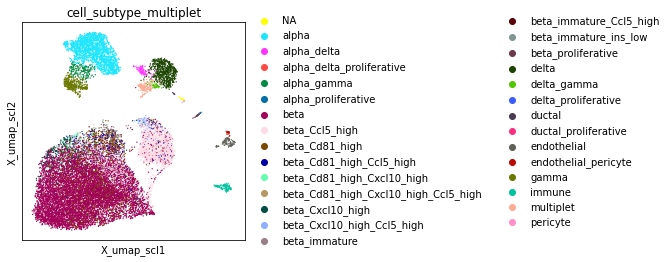

In [38]:
sc.pl.embedding(adata,'X_umap_scl',color='cell_subtype_multiplet')

### Save annotation

In [39]:
if SAVE:
    h.save_h5ad(adata, shared_folder+"data_annotated.h5ad",unique_id2=UID2)

In [5]:
#adata=h.open_h5ad(shared_folder+"data_annotated.h5ad",unique_id2=UID2)